In [4]:
from model import *
from data import *

import pandas as pd
import os
from tqdm import tqdm
import shutil
import random
import matplotlib.pyplot as plt
import cv2
import pydicom


Using TensorFlow backend.


In [6]:
import tensorflow as tf
from keras.backend.tensorflow_backend import set_session

config = tf.ConfigProto()
config.gpu_options.allow_growth = True
config.gpu_options.per_process_gpu_memory_fraction = 0.4
set_session(tf.Session(config=config))

In [5]:
DATA_DIR = "/data/krf/dataset/ChinaSet_AllFiles"
ROOT_DIR = "/data/krf/model/unet"
LABEL_DIR = "/data/krf/dataset/"
TEST_DIR = "/data/krf/dataset/stage_1_test_images/"
MASK_DIR = os.path.join(LABEL_DIR,"stage_1_train_masks")
CASE_DIR = "/data/krf/dataset/stage_1_train_images/"

In [6]:
# import os
# import skimage.io as io
# ANOTHER_DIR = "/data/krf/dataset/MontgomerySet/ManualMask"
# leftdir = ANOTHER_DIR+"/leftMask"
# rightdir = ANOTHER_DIR+"/rightMask"
# mlist = os.listdir(leftdir)
# for msk in mlist:
#     img1 = io.imread(os.path.join(leftdir,msk))
#     img2 = io.imread(os.path.join(rightdir,msk))
#     img = img1 + img2
#     print(img.shape)
#     io.imsave(os.path.join("/data/krf/dataset/MontgomerySet/mask",msk),img)

In [7]:
#产生验证集

 
def mymovefile(srcfile,dstfile):
    if not os.path.isfile(srcfile):
        print("%s not exist!"%(srcfile))
    else:
        fpath,fname=os.path.split(dstfile)    #分离文件名和路径
        if not os.path.exists(fpath):
            os.makedirs(fpath)                #创建路径
        shutil.move(srcfile,dstfile)          #移动文件
        print ("move %s -> %s"%( srcfile,dstfile))
 
# def mycopyfile(srcfile,dstfile):
#     if not os.path.isfile(srcfile):
#         print "%s not exist!"%(srcfile)
#     else:
#         fpath,fname=os.path.split(dstfile)    #分离文件名和路径
#         if not os.path.exists(fpath):
#             os.makedirs(fpath)                #创建路径
#         shutil.copyfile(srcfile,dstfile)      #复制文件
#         print "copy %s -> %s"%( srcfile,dstfile)

# import random
# flist = os.listdir(DATA_DIR+"/CXR_png")
# num = 70
# for i in range(num):
#     idx = random.choice(range(len(flist)))
#     img_fp = DATA_DIR+"/CXR_png/"+flist[idx]
# #     new_fp = DATA_DIR+"/val/"+flist[idx]
# #     mymovefile(img_fp,new_fp)
# tlist = os.listdir(DATA_DIR+"/val")
# for t in tlist:
#     img_fp = DATA_DIR+"/CXR_png/"+t
#     new_fp = DATA_DIR+"/val/"+t
#     mymovefile(new_fp,img_fp)

# import random
# flist = os.listdir(DATA_DIR+"/CXR_png")
# mlist = os.listdir(DATA_DIR+"/mask")
# flist.sort()
# mlist.sort()
# num = 70
# for i in range(num):
#     idx = random.choice(range(len(flist)))
#     img_fp = DATA_DIR+"/CXR_png/"+flist[idx]
#     new_fp = DATA_DIR+"/val/"+flist[idx]
#     msk_fp = DATA_DIR+"/mask/"+mlist[idx]
#     nmsk_fp = DATA_DIR+"/val_mask/"+mlist[idx]
#     mymovefile(img_fp,new_fp)
#     mymovefile(msk_fp,nmsk_fp)

In [8]:
data_gen_args = dict(rotation_range=0.2,
                    width_shift_range=0.05,
                    height_shift_range=0.05,
                    shear_range=0.05,
                    zoom_range=0.05,
                    horizontal_flip=True,
                    fill_mode='nearest')
myGene = trainGenerator(8,DATA_DIR,'CXR_png','mask',data_gen_args,save_to_dir = None)
valGene = trainGenerator(8,DATA_DIR,'val','val_mask',data_gen_args,save_to_dir = None)

In [9]:
model = unet()
model_checkpoint = ModelCheckpoint('unet_lung_1015.hdf5',monitor='val_loss',verbose=1, save_best_only=True)

/data/krf/model/unet/model.py:80: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=Tensor("co..., inputs=Tensor("in...)`
  model = Model(input = inputs, output = conv10)


In [10]:
history = model.fit_generator(myGene,steps_per_epoch=100,epochs=20,validation_data = valGene,validation_steps = 100,callbacks=[model_checkpoint])

Epoch 1/8
Found 66 images belonging to 1 classes.
Found 638 images belonging to 1 classes.
Found 66 images belonging to 1 classes.
Found 638 images belonging to 1 classes.
100/100 [==============================] - 118s 1s/step - loss: 0.5128 - acc: 0.7380 - dice: 6.2037e-05 - iou: 3.1020e-05 - val_loss: 0.3754 - val_acc: 0.7444 - val_dice: 6.3294e-05 - val_iou: 3.1648e-05

Epoch 00001: val_loss improved from inf to 0.37536, saving model to unet_lung_1015.hdf5
Epoch 2/8
100/100 [==============================] - 107s 1s/step - loss: 0.3133 - acc: 0.8891 - dice: 0.6970 - iou: 0.5328 - val_loss: 0.2905 - val_acc: 0.9098 - val_dice: 0.7796 - val_iou: 0.5167

Epoch 00002: val_loss improved from 0.37536 to 0.29046, saving model to unet_lung_1015.hdf5
Epoch 3/8
100/100 [==============================] - 107s 1s/step - loss: 0.2781 - acc: 0.9264 - dice: 0.8412 - iou: 0.7236 - val_loss: 0.2937 - val_acc: 0.8821 - val_dice: 0.6724 - val_iou: 0.3887

Epoch 00003: val_loss did not improve from 0.

In [ ]:
# testGene = testGenerator(DATA_DIR+"/test")
# model = unet()
# model.load_weights("unet_lung.hdf5")
# results = model.predict_generator(testGene,30,verbose=1)
# saveResult(DATA_DIR+"/test",DATA_DIR+"/result",results)

In [ ]:
# print(results.shape)
# print(results)

In [ ]:

img_idx = random.choice(range(30))
print(img_idx)

mask = results[img_idx,:,:,0] > 0.5
print(mask)

plt.imshow(mask, cmap=plt.cm.bone)

In [ ]:
IMG_SIZE = 512

def loadDataset(datadir):
    image_fp = os.listdir(datadir)
    image_fp.sort()
    images = []
    for img_nm in image_fp:
        tmp = cv2.imread(os.path.join(datadir,img_nm))
        b,g,r = cv2.split(tmp)
        res = cv2.resize(b,(IMG_SIZE,IMG_SIZE), interpolation=cv2.INTER_AREA).astype(np.uint8)
        images.append(res[:,:,np.newaxis])
    images = np.asarray(images)
    print(images.shape)
    return images

In [ ]:
images = loadDataset(DATA_DIR+"/test")

In [ ]:
plt.figure(figsize=(20, 10))

img_index = random.choice(range(30))

plt.subplot(1,3,1)
random_img = images[img_index,:,:,0]
plt.imshow(random_img, cmap=plt.cm.bone)
plt.axis('off')
plt.title('Lung X-Ray')

mask = results[img_index,:,:,0] > 0.5
print(mask)
plt.subplot(1,3,2)
plt.imshow(mask, cmap=plt.cm.bone)
plt.axis('off')
plt.title('Predicted Mask')

plt.subplot(1,3,3)
plt.imshow(cv2.bitwise_and(random_img, random_img, mask=mask.astype(np.uint8)), cmap=plt.cm.bone)
plt.axis('off')
plt.title('Predicted Lung Segmentation')

In [ ]:
croped = cv2.bitwise_and(random_img, random_img, mask=mask.astype(np.uint8))

In [ ]:
print(croped.shape)
plt.imshow(croped, cmap=plt.cm.bone)

In [2]:

case_list = os.listdir(CASE_DIR)
case_nm ="02c2331d-b3fa-4d55-bf86-f0efbd589c86.dcm"
case_fp = os.path.join(CASE_DIR,case_nm)

In [3]:
def testGenerator2(test_path,num_image,target_size = (256,256),flag_multi_class = False,as_gray = True):
    f_list = os.listdir(test_path)
    f_list.sort()
    for f in f_list[:num_image]:
        #img = io.imread(os.path.join(test_path,f),as_gray = as_gray)
        img = pydicom.read_file(os.path.join(test_path,f)).pixel_array
        img = img / 255
        img = trans.resize(img,target_size)
        img = np.reshape(img,img.shape+(1,)) if (not flag_multi_class) else img
        img = np.reshape(img,(1,)+img.shape)
        yield img

In [17]:
num_img = len(os.listdir(CASE_DIR))
#num_img = 1000
testGene2 = testGenerator2(CASE_DIR,num_img)
model2 = unet()
model2.load_weights("unet_lung_1015.hdf5")
results2 = model2.predict_generator(testGene2,num_img,verbose=1)
#saveResult(DATA_DIR+"/test",DATA_DIR+"/result",results)

25684/25684 [==============================] - 932s 36ms/step


KeyboardInterrupt: 

In [31]:
def saveResult2(test_path,save_path,npyfile,flag_multi_class = False,num_class = 2):
    f_list = os.listdir(test_path)
    f_list.sort()
    for i,item in enumerate(npyfile):
        img = labelVisualize(num_class,COLOR_DICT,item) if flag_multi_class else item[:,:,0]
        io.imsave(os.path.join(save_path,f_list[i].split('.')[0]+".png"),img)
        
saveResult2(CASE_DIR,LABEL_DIR+"/stage_1_train_masks",results4.astype(np.uint8)*[255])

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0004cfab-14fd-4e49-80ba-63a80b6bddd6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/00313ee0-9eaa-42f4-b0ab-c148ed3241cd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/00322d4d-1c29-4943-afc9-b6754be640eb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/003d8fa0-6bf1-40ed-b54c-ac657f8495c5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/01b56434-4dd9-4994-bcc5-0b70a36e415a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/01b9e362-4950-40f5-88fa-7557ac2a45bb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/01be392f-a46d-4aef-a57e-9cd1a80dd47e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/01be3fe5-4a91-4c57-9af6-305966a7d0aa.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/024cff3e-86d2-4658-b204-79b94b74b94f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0280a39c-4891-4a7b-8073-710c3f5577a3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/029216c8-ea0d-47bb-88fd-bf611cc5d1fc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0294b4aa-5614-4b33-80a4-2c31b639e5b3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/04707463-aae0-4989-ae73-f9162275444e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0499513a-5d48-4cf9-aac8-115e2a52fe1a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/049d7317-5a8b-4fc4-b81f-159fe6b45a92.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/04a6aa6d-bd6d-48b1-822b-21b81c4bdf3a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/05d4d725-02a2-4c90-8ef8-463217889ba8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/05dad446-45f7-44df-bd2f-4673d9502348.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/05dc3a75-2069-4f66-b5b0-ce7fd9efe60f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/05e6c2e5-897d-49d7-a35f-c0fd707a2992.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0638126f-126f-4f53-befe-538ff87597c6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0638709c-d31d-4a59-a9e4-fc408ae36145.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/063a4fc6-ef5d-4370-8b0b-c2752a4c905c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/063f63c9-7e5b-4360-8d19-0060d849fdbc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/06adea47-95e2-4423-bd9e-27daf8ed7de0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/06b1975e-066e-4430-bf60-c0a9d82cfdc3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/06b2f933-3ea2-4477-ac27-18f732d1f4e1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/06b52ffd-71b8-429a-a284-bb39240ed343.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/06efb50a-e30e-4e44-b323-c228c66d80a6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/06f188cb-3b24-41c8-beb2-9058d235e2a3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/06f1d0a2-d8c5-4229-9944-59da85c96b81.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/06f35e64-4b8b-404e-933a-c98f0b5614cc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0745b403-9006-4534-b28f-0e19ba3ff8e2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/07464097-0781-4632-90ee-39b0e53cd72c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/074764ba-944c-46ba-b7b4-bc422ff3b7fd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/074767f2-05df-4e74-8ba6-f7fd568f9279.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/07a7adcc-5911-46a0-acc1-aaac588c0245.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/07abb49d-c23c-41a5-b38a-b093011b59dd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/07aeb82e-773b-4498-95c0-fabdf4985bb2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/07afb190-e345-418c-8bd8-ca864b11b6d1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0808c4af-9ed6-46e3-a936-2cafb0004e6a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/08090a05-52ae-42a2-91e4-35dd3a8641da.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/080f1469-5384-4678-b0ec-513ae837b583.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/080f2b35-fcd5-473e-864b-a7dea3054cc7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0864e801-58cb-4df8-b7a8-dd9e32c97178.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/086b7fd3-3f6e-4701-9da6-921d703fc99d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/086c0080-f9e5-4f22-ab06-7ad7248e814c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/08725d04-9db2-4b52-87fe-6cdb150a4bb3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/08b9ee23-ff64-4494-b293-5e43f3de3453.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/08bc9387-94f1-4ce8-8958-15864bca9052.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/08c343b6-9dc4-405b-87b3-b6534abcb990.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/08cbc4cf-9efb-47e4-a77f-d734e6a273c5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/091cc2b7-8ba6-4fce-8ae2-7547117dbddf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/091d75a8-e23e-4cb8-af67-10cb314077ec.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/091d9bb8-eb0e-48ef-946a-254a4f8f0a0b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/091e90d0-bdb7-4815-935f-5b52b93ddbe6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/097771b8-ab5e-4b23-8116-6d674a688c88.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/097788d4-cb88-4457-8e71-0ca7a3da2216.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0977f16c-c343-42c9-95ed-d7ca996feb16.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/09794a15-ea37-41f8-8a0e-a56a9a93eaa6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/09d2a8d3-3ef9-4e91-8abe-d1c127747905.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/09d41130-fc56-4a25-96f0-862f00a790cb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/09d79f22-df14-4e5a-bc98-7a1d6bcd6965.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/09d868e6-ad0e-4a55-b8fd-cf46e84dd08b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0a51f668-b7b1-4d8d-9ab9-de1f702f071a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0a55219b-5303-4490-b173-6039f355db2f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0a578f72-dced-4550-8851-d8005549b724.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0a5a6574-d94d-441f-afe4-115ba66b322e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0ab601ca-5f86-498f-89ab-73208a353e40.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0ab731ef-0580-4a2e-9fa2-29a243b71c86.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0abbde89-55e8-4b25-ba9b-17a99f84bae0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0abf8707-def2-4383-9b0d-4b8c122e9af7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0b0860dc-b2ca-4016-a6eb-3a88ffb5ab2a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0b0b36c6-fa59-4cca-b939-aec774926e48.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0b0bd979-ce90-4ed4-8772-b136515e38c0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0b18b129-53a3-416c-8559-7a2e9748d2cc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0b6a7730-a747-42ce-ac00-f3dcc34df307.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0b6acd03-8392-49a6-bf52-4543fb678a25.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0b6c6a3e-4eda-4886-9182-e0b686fd9e53.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0b71e171-37a0-4f7e-827f-c8250180bbf2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0bc7f47a-ecea-4b66-811e-096004721a63.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0bcb0834-efa8-4fcc-9082-4a2dd4506dc2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0bcb73ad-aff9-4367-adfe-f9e87b229523.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0bcfe7ee-ada5-48de-990b-2a2fd6c6ed15.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0c391e0f-9927-48ce-801f-02eb000f72c3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0c3a7bda-26e9-4750-a295-5227365857c1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0c3b0389-1cd7-4352-ad3d-2be8bc95ba56.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0c4016ab-b81b-4266-b6f3-b13465b8d10e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0cbf3284-5b78-4e23-bffd-e546f7e76da9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0cc09b0a-1afc-4492-929e-ac53f15286b6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0cc27255-7f78-4093-84d7-04190a7d72ec.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0cc48c9c-0576-4d70-abc0-dd8cdc1eb788.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0ec6b85a-de25-4870-a100-0d7ca6c798bf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0ecd1c28-bf25-4d32-979c-448356e0edb4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0ecd37a6-c1bb-40cf-8e48-1020140ae173.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/0ed69049-8906-4b90-8841-727a7716c42b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/112ef47f-9c95-442d-8e12-35755033f034.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/113850e1-6d28-4d63-bc5e-807ab3213995.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/113daddf-b629-48e4-9d29-385ea77320ba.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1140291d-847e-4806-8a10-d0398888716f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1469ec7d-f6d2-4193-b5e2-5d2762d0a608.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/146c007e-546c-474f-8b28-9c321565e5e4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1491ad3a-c263-417d-af7b-159f05b72e63.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/14996682-7fb0-42e1-a925-ab2a639bae18.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1578e536-3b42-4258-967d-0ea897410008.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/157a7371-119d-4549-82be-fbecaac4bf54.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/157ad25e-fee4-4273-9d6f-725aa15bdb28.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/157b06eb-8099-4a11-9339-43d5516830b5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/15e8d510-5e1a-43f9-9d1a-16a1bd6728ab.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/15e98e98-57f1-4641-8c33-de67995cf441.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/15ea3d73-122d-4273-83e0-01f62d801ca7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/15ec434a-959d-4e67-b1c2-2e9fa10b880a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1623088d-9f8c-4910-b681-c81fef043fa3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1627a4b4-a485-43a4-9b9b-1a9a4240c158.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/16295f19-6f89-4bdf-bfc5-0457e4b4bb89.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/162b17de-b15d-4122-9352-ec3445f61f35.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/169e144f-7374-4d11-b9f8-96ebb8ed56b2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/16aa1662-cdcd-41e4-a2fc-4141bd950b39.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/16b15680-1f2a-468f-abe9-f3ebbb50dca4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/16b2f378-a695-44d4-b136-305a7b17155f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1748e4e2-5c73-4794-81fe-2c5fe4af8cdd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/174a9cbb-cf69-4122-b0b4-e4dd980b4b42.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/174dea20-4712-4425-8328-b0a38e8f88ef.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/17533758-98bd-48d4-adc1-07c8f4dcf9a9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/17c3519c-2700-4357-87d4-94f0fb4f7bbe.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/17c588e7-bf2e-4a0f-a766-1455b6e80931.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/17c67743-6d92-4dda-adae-61bc41724da4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/17c749dc-e97a-4c5c-b4f4-c68b135a1a64.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1831b4b0-803e-4950-9086-5455d74d6a44.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1833104e-7288-4643-ab45-55ebf4b800b3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1833bbfb-e89d-42b9-9b13-02fdb6045e5f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1833d175-c9c8-40f3-9687-2a253e447579.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/18a919d8-5d23-4cde-bb99-dc0e457babb5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/18aef831-82d6-4847-953e-9c06f1e2f5fe.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/18b0c02d-4023-49a3-9a47-ad663cc1c7c6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/18b3a0ce-d693-4953-992a-4f83bcf89697.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/194624d4-fdd9-4876-ba09-5ef69347a1da.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1946b195-a5d4-40b4-883c-3e0595a525d7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1947e51f-8e73-46b3-91ad-4d35489a2793.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/194917f4-f78a-49f9-a35e-3de36e668f5e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1b8a2b4f-11e8-4d96-aa82-9493128a88f1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1b8e0632-87bc-48fe-9c9d-8523396767aa.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1ba253cb-105f-4250-80bf-be5565bd359c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1ba35bfc-7641-42cd-9988-260fd0f82be1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1e543f92-8124-495a-bde0-8f81bcaedce0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1e74323d-d449-4a93-aad8-2df912970b1c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1e8fbc6f-08f6-4801-b437-69d9e5bde269.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/1ebe7102-56ce-40f3-8897-5ec33f446625.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/2139214a-4a50-4144-9c2d-eb4c929e1e7e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/213c5da7-32fa-482c-be59-94ea948ffbff.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/215d0abd-60fe-457e-b6bd-de970a9162fa.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/21934e87-a655-4371-bf85-a8a68370de79.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/238fdbc6-8081-4e89-a541-6c5a4f5aa232.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/2397b2f6-3dfa-476c-89ea-e9992c5bd9a9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/2398ea30-8cf0-4265-b374-0300a5181759.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/239f7e39-e679-4892-9c87-04d1e4fd240f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/278696a5-840a-49b3-b5f8-84cd9a236c23.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/27873b15-51d1-4313-8447-bc2fc9090d6a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/27b2992d-54c7-4fcd-a060-b118bd8fe5ca.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/27d1956f-5e94-4fa3-b1ee-0fb2896d9c7d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/2b57dc05-b925-4d58-b536-c9eae9677d05.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/2b70a757-4dff-4d97-baf5-f41b8d3ab4da.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/2b74be46-2b42-4baf-9c9c-cc253e766a56.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/2b75b5f9-285f-4e51-aed4-26e08811ff8a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/2e04a49d-3aac-4245-be51-8e96ce679a0c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/2e0da34c-1385-4691-be5c-cefed3f4fa7e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/2e13b706-c1be-4f91-9108-dcd693f0c076.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/2e13eff6-7bb4-4b45-846f-1522888dbfe1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/314f6860-4382-4ccd-a787-34b388e673f1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/315275a1-3a50-42a6-9528-ba99a286be5b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/31559539-9087-4bd0-806a-30413a980cf1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3156adea-d1f0-4a8e-9dfd-fc1d9bf5fc1f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/319a8d01-4507-4882-a8fd-f667073fc847.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/319c7cc1-72c8-4b0d-96b2-bf6de8c26021.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/319e7123-a32b-4971-acd0-975c52958411.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/31a00524-b6eb-4d94-99ed-e70827499507.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/320df0f4-4189-401a-a836-569ba4f8f389.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/320e8587-ab3c-47d0-9a89-fcc2f5cb5c95.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/320ed4b4-0793-4224-866b-29d9cfc5b90f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/320fb85d-09c5-4c0b-be25-91c0086c2c51.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/329c254a-e6bc-44cf-bc09-365d5d43f4df.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/329e55d1-2e27-4ffe-95b1-df5f5015aae6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/32a538ce-d71d-4a1d-b0b2-865111dc5136.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/32a5977f-f8ab-41c9-9b51-5387248e4675.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/32e6fd38-0e31-450c-93ec-f29ea5a6ad2c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/32e8b837-8656-47e1-87ec-b365c7670984.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/32e9a5df-2282-4204-8355-030f26816f33.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/32eb1efb-96c1-41a9-b6a1-498ee55a371b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/335a9cea-7399-40d9-8743-7dc70f44110b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/335d1349-f547-4c69-a2fe-ab0da3230f44.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/335d17b1-bdfb-4939-9dc9-fa93f09648eb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/335e0c90-7426-44a3-a9c3-11b21485d840.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/33b759a7-cc42-4d7e-8f54-c1a32b389674.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/33baa9c3-1fef-49b0-9f03-3d260dca565c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/33bb93bb-d66b-4e5d-b38b-c3de96234c24.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/33c0ccce-8857-45de-bccd-e8cfae611161.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/34289db0-ad2b-4f15-86d3-446abad897e2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3428d5f3-ae3f-43d1-9f7a-9d7d4afd5782.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/34297b7d-9e22-4e73-b105-a8db72ad36ee.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/342bd0cf-b337-40e9-8512-eb170292e2f2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/34873b9f-5305-404e-b7f7-5105feede48a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3488c0cf-8257-454e-a9a8-fdcecc72d5ea.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3488f56d-1c15-45f2-ad45-ee5b11196442.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3489804c-d115-4f87-b5c9-301462cdcad4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/34dde192-6b08-405f-9672-60e19c896d28.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/34e19eb5-78d1-42b9-bc47-b043d97feefb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/34e1c8eb-06a1-4b7a-a19e-1b19268a3ebd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/34e283d8-3c14-4d47-8882-fb53ec242f87.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/35580bc7-a52a-4dd3-a78a-07219cee6874.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/355bdf6a-2a9d-4e62-82ad-9cdb3c561ccb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/355ca2f6-2947-4f1f-9d21-a876bd6df049.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/355e1c01-1ed4-4219-bed0-483d52e23c84.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/35c0dbf0-11f1-4f62-b5ed-ef58ea4d6c04.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/35c10804-455b-4753-aaf6-72cd9a4916eb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/35c45480-3cfc-4988-8bd7-4c1ee56ed88b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/35c50ffe-4ebf-4683-8d35-ede4ce6e4a75.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3646e1b0-48d7-4a90-83a0-585654f5ad23.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3647d0dd-fcf0-4606-bddc-ba872f5f7ccb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/36491026-0b06-429a-97bf-644518295055.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/364aa43b-3693-4c51-a0d0-78c286262540.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/36ac7bd2-34b4-4551-96b9-8404ec7d9079.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/36af11b1-75ca-473d-b29c-4bfa1802a81e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/36b39f2c-26bf-4436-acc5-08cb70fe0d7b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/36b750d4-ac1c-4301-addb-bb00f6edad82.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/37261c45-c1d3-4e6b-9d3a-a2ca48b99db8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/37280a31-74fe-474a-879e-d349dd211e18.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/37290d29-2a81-4c9d-aef6-15eea1376e0c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/37296532-0632-40c6-ba5c-377e4d12cacd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/379b92af-9463-4071-a11c-8c475992d5b1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/379ead0e-f5dc-435b-aea0-3cc8e808de11.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/379ee9d4-4c6f-41ca-a9ec-9c07bc721f7d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/37a09cbb-e618-486f-bf4c-011cb5b5d69c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/37fd6daf-9d93-44a8-8818-20a423de28c2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/38016466-59bb-4364-a099-03813dd09f46.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3802b256-c042-4f52-ab00-73877c1d1a57.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/38062f40-82c9-4322-b2bb-dacca835bb3b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/388d9b4f-6c31-44ac-b878-8f5c3843fd1f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/389121d2-daa4-4ab1-b080-905c3c11eee7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/38929efc-a8ad-42b5-9fff-8ba881a7873e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3892a267-e293-471a-b15f-ba5d2e453f64.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/39072ec7-b587-4b1b-b63f-b5b1f36c5aad.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/390dad2f-bd13-4f16-92af-4e061499eddc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/390eb7b5-2719-408a-b9ac-7ad6225c4889.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3912ec76-6f03-4ce6-8065-8e5f442a2437.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/39bc1a90-bdfa-4282-af4d-6a3a92b1d577.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/39be0109-70d7-4bec-a59e-970da31447b2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/39c1395d-f5d7-4ce2-9154-04bd38bc8729.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/39c9fa1b-d758-4985-86cc-ad6e8f5f2171.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3a54fc42-0d7a-460e-8f19-2e353a01795a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3a570b6e-35b5-481d-874c-b5c166453927.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3a58fb6d-911e-419c-b00e-b7d29918baf1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3a59f032-5ef9-4452-82b4-8dfddcbfe46f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3b0e8d0a-230a-4483-96c9-d91bb17be632.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3b12ae6f-0386-45b2-8fab-5ae6b93fbfda.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3b16ec55-a7b0-4924-99b9-222623e807fa.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3b17bfb9-8657-4b74-bae8-f597877f4227.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3bb78602-d19d-4418-a505-435e52fbf1ba.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3bb7e241-81e4-4257-8c45-1a51d6b798f2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3bb9b9b3-b086-4083-ae6f-d1f86c3eb089.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3bb9dce3-3f58-4a41-a75c-fa0748eb288b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3c4c732b-8281-41ef-bd8c-98f98a1c11fe.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3c4cb955-7052-43c2-83f6-01ed9b47ba93.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3c51d6fa-6fb9-41b9-b723-25121b75c306.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3c57615b-498d-4d1d-b49e-48c3c9ee60df.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3cf4dbff-f5ff-407e-b902-be8040ed992a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3cf53cf7-6306-446c-8274-a487bdd3988f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3cfaf293-a1a0-4130-b994-ad3df8a4008c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3cfbf744-9777-4804-b615-6b3e039322a6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3da7cc6a-7864-4ab8-8842-297650b7db19.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3dac7ad3-43fa-4b57-8990-84cbc11d454b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3dae24d1-bf9f-468b-9cfd-4fb768b8eb53.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3daf4e31-32b6-486d-8091-4747a365cf60.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3e5bc7cf-8a38-4632-9566-64c653b44b04.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3e5bfc24-2f0b-4d91-8fe8-923d27900567.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3e5d2773-d4a8-42eb-bc5a-395bf04b0ac3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3e5e1e9c-4b31-416a-a068-a4e2fc100f10.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3f167edb-74e4-4a4a-b710-9732659ac767.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3f167f68-6cde-478d-8e78-9ae22529c22f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3f189f11-c1f4-47a9-a1b0-886fb7344bc1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3f1d7f08-05a4-4ce7-923e-7b1159c509d8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3fcc1a52-4329-4c61-9a79-f62c237387dc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3fcd4b0a-c575-40a8-95ce-34eab7025d62.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3fd032bc-c98f-4fc9-8a4b-903797721666.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/3fd5687e-bc16-4802-a44e-163f667882e4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/405fc22f-ea3f-481e-bb8e-b6b75ce9b916.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4065ab87-695f-4abd-9339-6be589e1c469.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/40668cfa-55dd-40a3-86c4-805dd9d32202.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4066e3a3-a87e-4132-b575-c77a96169d55.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/41062f81-ee4c-45fa-8e61-0e5459bcc0d7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/41068199-0620-47cc-b450-c8db8b6e99b5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/410ba4b1-4c3c-467e-b58e-838ded07e266.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/410f690c-a41c-4891-a764-d221a8726747.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/419f823d-3113-4247-9c63-3bbdc4cc4d45.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/41a32ec6-3e48-4567-83af-253892292346.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/41a42062-6911-4f89-ac12-ea7829d0466d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/41abed8d-8781-4564-b0cc-9d4abbfcad5f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/425d97a7-c5ce-4380-ba60-5a01a6618e08.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/425f3402-d4c7-451e-a68d-db11e70e2183.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4261241c-2349-4c92-a283-e9d3af024c49.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/42619322-0a98-4494-9d8d-bccaa674ad07.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/432857b3-7580-497d-8bd3-4b31f88dbcae.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/432be6a7-fb99-4eec-827c-deb0310b8967.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/432c08e5-3a4f-4b42-9726-2f18f77aa0d4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/43379ac4-c626-468c-adee-f6843633e848.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/43f5cb7f-77fb-4d26-b55a-46a98422e35e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/43f60f5d-d72a-4c70-9c65-6dbc38d2db36.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/43f620a0-745b-47d4-af1d-02661f920f82.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/43f6b995-26f1-4796-8719-4fe008c7536d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/44a23bfa-5c34-4919-9b41-a31f1ff4fcf8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/44a6ee95-56fe-4a68-93d7-c5f046bfcb40.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/44a70c12-415c-425b-b215-9ae31db80b12.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/44a8fb24-5f75-4e9a-a187-70f3e608fd62.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4528fe4c-daaa-410b-9089-999bf26ca615.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/452a76e3-b825-4dd4-afaa-f2d0e2fd530f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/452ab672-68a5-482a-954c-492fd1a7fa42.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/452caa68-4d43-4bff-b47a-9c2759de46bb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/45dddc96-f7e8-4dcf-94b1-34349c0ffdc2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/45e18056-b7eb-4477-8eeb-7b740b61e093.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/45e249f3-bcfb-4a4a-af37-8252b32e8f8f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/45e259c3-c0e8-4d00-a6c8-f976328372ea.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/468180c9-dd14-4b34-a11d-60f05ed02d2d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/46863727-a70d-48a9-8497-fffabd1193fe.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4688892f-076f-4d48-85e3-34da2c3bf7f3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/468a6731-0bd8-4e30-8473-fcdd2998fc82.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4718a7d8-d064-4c10-83ea-3d8ee35bee57.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/471b74c7-0413-40e4-b683-d552d8c10e1b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/471ea4f2-38d8-4fa7-b68b-2f38811a5a2f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4720bf42-9a75-4325-a841-e2710a9c60f4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/47bc2d1c-615a-44b3-9164-ed70c06baed9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/47be0a9e-b6f7-4104-ab24-f3671287aead.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/47bff3a6-24eb-4dbc-8985-a9bda8fc4325.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/47c78742-4998-4878-aec4-37b11b1354ac.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/481260bc-790c-449c-992c-b4f467aab203.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/481285a5-9df3-4824-a806-67d6404e287c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4815cce8-5790-4c0d-9b3e-54a51a14de68.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/481ac025-aeb7-4d88-b451-74ec80514625.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/48d473f6-a2f5-43a8-ac85-9929e2e7bc40.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/48d69fc7-2bee-4068-a9af-59bd69a89714.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/48d77f2e-0e34-4996-a67c-396cfcbb7491.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/48dce60a-bf05-48db-b89c-bb075a4ad909.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/497f010c-5091-467a-bc3e-2c948ee696b0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/49819189-845a-49ba-9f8a-d775ab939761.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4982e734-a945-45fe-ab58-99b8e3241c6b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4983585b-4334-466c-bff9-36a3e6c7c1ba.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4a252e39-736e-48df-aaf3-3446a8f3ac3f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4a258020-a61c-49b7-9045-b271786ed1ce.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4a2abe71-8cd4-4d57-978d-2da7d67bd80d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4a2bcce2-c9f0-4990-95b3-58ad1aa0269b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4ade4645-44d9-45a1-b574-5d1718c1e76c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4ae0b788-62b6-486c-a95c-76764250c086.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4ae0ca16-68d6-4ae8-92b9-b73c8783f6d2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4ae315a5-733e-4de7-9f29-a095134382cb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4b808df6-3fd6-49e3-a0e4-2b31d9821ce8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4b8177c9-4436-419a-a044-6a1db71a8dec.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4b831076-3931-46db-ac95-0e11df232af8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4b85f617-4e30-404c-b9c1-5e9b8776dfba.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4c3e602d-e745-4f9c-bd5b-91129e431f63.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4c3ea79c-df15-44ac-a6c1-2ab834f7f7d2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4c4124e0-1584-49a0-97e5-76c708f072fb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4c43612d-dc22-473d-8194-6efa0110b39e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4ce52e89-424e-4263-ac53-c419f7219749.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4ce814aa-8366-4707-b17d-a2ecc503c4a8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4ceb55ef-766c-4c1a-8bfc-06e0b630be54.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4cec7c74-e39a-48d0-8ec5-2b04ad0bfa3e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4da6faee-c4af-4ea4-84a3-7c5733bfd249.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4da7bc0a-2c46-4029-8502-1577d527219f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4da8fe5d-6aa6-47f1-8541-5df517781123.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4da91342-5977-41f3-9558-335811f39d74.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4e3127db-cddc-4559-ab99-211baf0ec9e5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4e3168fc-fe0c-4bd2-bef9-ad5698d3c80b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4e31aec9-ea07-47c2-8712-678976de22af.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4e335c9d-1571-424c-bd07-aa1479021a01.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4ed11702-bf09-4d93-abf0-da79a87a7a35.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4ed3a113-8f50-4871-8489-1e1a17a243ab.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4ed5b2b2-9aa1-49f2-84e6-4f634744039e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4ed5cbdd-2e5c-4087-afd1-4310033fe9af.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4f790c33-0aee-4bad-bac2-105290b4e171.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4f7c7705-738d-4ab2-818c-1fadc70c1fee.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4f7e3856-e6fa-467d-b8e2-fd35bec78da0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/4f7ffff6-9e9e-4bf7-bb8a-abdce9b24a46.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5003f421-e6d3-4c2c-b713-eba27a9078c2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/50059823-7c93-4f6f-b1e5-e3ce3351b4df.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5006f783-56af-4ad9-a37b-c80bd789ddbd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5007426f-9db7-4456-8746-6dfc36eec411.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/50abe491-1efe-4bbc-8643-ffd32c6535ba.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/50ac73f3-76ef-4610-a62a-88ef8addcec3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/50aca2cc-0998-45fe-902b-88dd222539a1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/50acfb42-e161-455c-982f-78d2ffeb12e3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/51697467-c3c1-4e6a-9977-2ebe3ca04533.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/516d4e13-5fd7-4e1c-88d1-80e9d86ec379.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/51702d7b-bbda-42f0-90a8-cb7cb1812a58.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5170a7d4-a119-4471-9f3c-824756bf6644.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/52286e47-f654-4cac-8ecb-346ac46333c1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/522f915a-c395-4158-b7fb-defa93cac8ea.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/522f994e-297f-4269-a931-71d098a083bf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5237331b-b256-4a55-8877-003e36f09f22.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/52d3b6f1-76d3-487b-88ff-663f80ac4da9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/52d4ae22-7dfe-478f-abac-c6feb913df92.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/52d8daa8-bc19-4128-a8bd-60b6c0384ae2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/52debd65-65c9-4a26-bbfd-eac603f41e17.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5388b543-b3cc-4d17-b620-e9defedd7715.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5388cc79-bfa8-4035-b676-f5407859f261.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/53891a86-1918-410b-8f0d-2170706be8a2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/538c3d1c-14b0-4604-9cd4-4a18b63a40ac.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/54173812-e677-48a6-a916-b290b061ea31.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/54193dc8-0555-4bad-96a8-114ed1bddaca.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/541f235d-c207-4092-8530-8d826e2fa5eb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/541fd23b-53f2-4bfc-abe6-92f330f2474e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/54adda49-e4a2-4706-af0c-40174ba821a6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/54ade882-3ada-4442-b66e-740b5a65e014.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/54b49d80-e964-48d2-8890-4cf2523fb063.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/54b53c56-3a5d-40c0-9a2d-c0b287944a60.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/55605927-db12-4b82-8002-d0f045da5fc9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5560d6b5-4441-4e3b-93bb-c68e3a142aed.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5561e04d-f30f-48fd-bd8b-6e483b9cdef9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/556566b6-d912-47b6-86fe-316d199dfa2d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/561075e2-b494-422d-9eca-060b89fae03e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/561143bb-f604-43a4-850f-b350a42a6e81.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5611941b-09f2-4f1a-a383-9053bd749e27.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/56130832-8cb2-4c91-a98e-a40b1f1d1dd2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/56b59af5-bcfa-4d99-ab3c-3603783851f6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/56b5c0cf-8a3c-42f2-b3e2-adb2f550c451.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/56b5e2ac-86d7-439e-b061-2ce718710d76.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/56b6e64a-0697-4768-a23c-11e2b2cbdea3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/576f3fdc-8864-4709-b72f-a7b33fee8435.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/576f691f-ec9f-46a3-9f06-0b72c9702d8c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5772e6c1-1117-448f-bf55-e57599fedcde.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5772efe6-5336-474e-a619-d2d5529fa316.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/580d5f70-666b-4f49-90db-da49cccd6519.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/580e7b43-710d-4b8e-8aa8-ed6da1517ee2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/58117ccf-70df-491c-8830-4f7ea3f9fa90.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/58119b67-26c8-4081-9c3e-0339604982cd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/58bf27e0-a307-4d29-a977-511340f4572f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/58c2439a-ed5a-493d-b8d3-bf57d08af322.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/58c317a1-291e-4bfd-97ad-297688bf530e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/58c3c006-1f48-458f-b469-4afcef2b8e76.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/595d455b-2563-4e7b-9915-e22aa9b5b287.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/595dc1f9-88f2-44e3-840b-cd26b166337b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/59605a17-28c6-47f6-84bd-af9460b17c14.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/59611489-9b61-4b78-a423-4d0ad4acf0db.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5a220a92-bf26-451f-826a-6886460f7671.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5a23151e-fceb-4d74-82b1-803bf1234450.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5a29bf0b-e88c-4c2a-a793-6a84c9cb9856.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5a2efed9-8132-4de5-bf6f-c73c7d014530.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5ae5646c-545f-4ac4-813f-0e9a53f3f474.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5ae70f1f-2b80-409e-8347-993f58185f3b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5aeb9a45-0897-43db-bceb-fa36b87c4a3a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5aef8439-6fc5-45c0-9e52-1524f62a69f2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5ba9f6a7-9f57-40f8-9168-1bb1841e65ff.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5bab9e56-d8ea-47a2-8848-fd768e4a52af.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5bace529-66de-4eb0-bede-4da1c4aed9cd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5bad55a2-06e1-4ee9-8fbd-555a1f75e647.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5c3eaccf-5cf4-4ba3-8240-dbbeedfeef85.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5c3fe0d9-79e6-4f7a-8d31-f0747cfc28b3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5c40d1dd-5bc4-4f59-8c07-275b246cf1bb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5c433812-c8db-47af-94ce-9c6ee552cf7e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5cfe7d99-d956-479c-85cf-7f8d65465f5b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5cfec0c5-3b01-4238-9fc1-64a6793da269.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5d000d56-edc8-4f5c-a719-2233b722e005.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5d05e25a-b473-4291-9fa5-3b5fea50f368.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5d91c7e7-e7e1-4ce0-a9c5-e8cf231950f8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5d9a3bee-f9c3-4107-b021-f9f99eb55a4a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5d9a916a-ddc0-4821-948b-7a9b16e3a31a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5d9ae0aa-09ad-4271-953b-6c19749af5bc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5e4353af-72ec-46d4-80fd-33680fb59176.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5e44964f-bde6-425b-97fa-fb3b596190cc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5e461bd3-5247-4b18-a099-ab0a2ba6b437.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5e49c8fe-ec55-4fdd-a136-78538f480898.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5ed67fd4-8c5e-45ef-9d0c-1f8fef1e2fc2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5edecee7-9bcb-43b3-9bcf-3f35265d6a6e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5edff1e0-b0b9-4aa2-9c78-1cdb49d30ead.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5ee5de4e-7767-4d6e-92a9-913be19d0a47.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5f866831-9057-4be0-ae41-8164062a0a22.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5f89a135-4b20-4ac9-851a-6d4a27827d25.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5f8b20d1-5a0b-4655-877c-cae5ac0b88b6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/5f8bfb85-5e61-4ba4-af9a-89b9365b503b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/601f2df5-f763-4c5c-8528-3442c7721a15.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/60228a22-9d7f-4723-a6e4-349e9d17348b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6025fe0f-24d5-4dc6-857d-a95ebb9af98a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6035822d-4d60-4031-be82-d27aeea9877f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/60d42b93-cacf-43df-813c-5e1034312e7f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/60d439ce-dd5a-4d41-bc80-849786a0ada6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/60d9a224-16b8-49ea-adab-ace0359c257b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/60dabf7b-68bb-46df-892a-7ceb8c14515f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/617ebe95-c367-4a78-8f24-3666c095fff1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6180c3ac-645e-41c2-8705-8358b2fcb6d9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6186e217-86ef-4140-8b7f-ae056a4eaf3b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/618cc352-6800-48b0-a293-e9909dd1f7a5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6247d1bd-209d-4d5c-8fba-09e862204821.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/62481a3d-6363-42e0-b65d-80d35d8ee489.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6249ddb9-1c22-4b28-84c4-cbc153cbb8cf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/624a95b9-354b-415e-8bcc-382c6510469d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/62dfc10d-f6fa-425c-8ad9-c20f11820507.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/62e7f210-65e0-40e1-ba52-8c21b6e767e9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/62ead050-f18d-44da-b85e-7b37d59fd402.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/62ec09ed-1610-4e22-91f1-dab682d5c2cc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/637b1dfe-c876-44d8-b5a9-e5ebe3663773.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/637bea6e-a296-4d83-b68a-7cee48434bdd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/637c030f-e379-4db6-bde2-c2f2ad0028fa.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/637c0606-2cc0-4512-a9e7-9003c4af2d62.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/642da3d2-2da6-4973-9406-9d88c0f2f2c2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/642f783e-4581-40a3-8a25-34b7a5353f7d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6432e2ca-b521-45aa-b9ef-25761c518abf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6438d645-6fdb-4fda-8598-a4c1902a33c2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/64c7582c-6088-439d-be4a-67a6da16d787.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/64c8352e-95ee-40bd-86a5-799d705ab852.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/64cb56b3-df09-472f-ba13-201c40f4987e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/64cd1375-6d81-4200-be9f-afc1a7abe69d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/655b8f82-6ac2-43e3-867b-733b0d2307ad.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/655c2089-7835-4749-bbcf-283d0531158c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/655ce7e9-2b01-4e06-849a-da6eb968de08.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/655d7db2-1a98-4c36-a64e-a56318454863.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/65f28631-191a-4882-85b5-11cd65efb19b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/65f61ec4-b763-4d94-93ef-135e22717e12.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/65f91a4a-c02d-4c1d-938e-b22ba02dbec4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/65fa42f0-ffe5-48c3-bc52-20e33b346f1b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/668c7bea-ca06-4131-9567-33078f889aa0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/668dd12b-6cc1-4d97-8713-24bb92f8c221.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/668e680e-64ea-4730-ab78-9d2aa81de2e0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/668f5041-3bc8-45f8-88d9-2fab7d1b07b3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/670fe5a1-c998-46bb-83c0-e1925c6b3c71.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/67125768-f10b-4605-8e7d-f0202b32df4a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/67128833-fc5c-441a-8467-875a513e0bcf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6712b830-bb81-4536-8145-3ec571b860bf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/67bda6e9-0606-4653-ba20-5f48fa5e5b19.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/67bde75b-1e5b-4697-a639-786524a36306.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/67bf005e-6939-47c6-a73f-8eeec0df47bb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/67c15bfe-00c9-4911-bf32-6d99df399dcc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/685e12c9-ef16-4040-90f8-92649a23f8e5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/685e484d-8955-43ff-92b3-925cdc03c4ac.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/68644ae1-22cf-4237-b7af-85d66df34672.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/68644ba7-8699-4b76-aac3-6237c3b2f20d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/691d0575-b3a4-4da8-998e-3e8e124a9e6e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/691f01b2-60b0-49ad-847a-f2dcdffa22ec.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/691f5a2a-73e9-40b2-aa76-aac6ee7e0b2d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6921f629-de79-437f-9ac6-155713cfbbe1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/69a4ab5a-da8a-4a93-9d83-801a700003e8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/69a6dd33-abbc-46f1-87e0-7b2a5a25bc2d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/69a9b1fd-3ad7-4bb2-b6a3-7540fdc34b96.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/69ac2b3b-864c-4538-8275-2903a486a841.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6a4f9794-8d25-4b55-8931-b97c0cdc64fd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6a54a939-98bb-4452-a18b-8c13d108675c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6a552a6e-0b8e-4825-88ab-72c1da5ed42b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6a564802-a75c-4a40-957b-110303263bf7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6ac9716b-2538-4351-b465-7a64d3211518.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6acb1c71-0b62-4b66-9acb-96d9c1eb977f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6accf9c4-1818-4ade-9cba-5c7d58be3978.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6ad0b1b1-255b-4c39-8950-f3ce7f9440d5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6b55c834-97d8-4d7f-b371-e8f71d4ad0f0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6b56a3bd-389f-464c-a506-c20d2a2d5b0d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6b56ba33-aef4-4d1f-8618-f999410c4983.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6b572fbb-3a89-4905-865c-324938baa5c3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6bdeb23a-a3ac-4490-a2ab-2857180671e1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6bdfa91a-d42c-4052-9584-e218e36dd509.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6be1c923-bc3e-4f46-a826-2c9f06217c33.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6be29d68-1927-4609-a7d2-4fcc9ccaf9af.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6c7f1aae-7eda-4a03-9b3c-9bfd17ac953c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6c7f70fa-16e1-4e66-b037-526273252bff.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6c801f4c-db39-49cc-b69b-782b38265ddc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6c8140b2-dfe0-4fcc-926b-d7be2196af10.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6d1f151b-b100-4086-9c9d-16e510aec767.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6d20ac5a-6f59-4b17-8d9c-5e6c1eac3c74.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6d2354a2-9b64-4dd4-b4fc-f047cbb73e3e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6d2371e4-f8cd-4f6f-bf9e-1e8773b3960a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6dd00cdb-6ce8-407c-906d-322688b78a4b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6dd191db-fa69-4197-ac72-943f4795170f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6dd1e370-878f-4558-a5eb-6c248a5851cf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6dd2184c-de2f-4da9-82a7-70db5b0e0bc6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6e71c881-b814-457f-8d31-00bda463396e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6e73017c-4e3a-499b-a597-4a797bb179de.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6e74d273-9bdb-4fb0-8a0c-edfda365df2e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6e75f4ed-46b1-49ff-bae2-e389adc9e6e6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6f0b7ce0-dbac-4190-94eb-c252d9a36b83.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6f0d2ff9-c0dc-48c3-a944-1f18dc185e1f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6f102297-4e9a-4c0f-ae5b-231d982c0bd8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6f102dcc-12ca-4fbf-999b-69ca7db9f0b3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6fadce8d-3ee4-4f94-b05f-e6f0bc531c6b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6fb0791a-7bf5-4a8b-9bc2-dd539b6de2db.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6fbbaea2-3c59-4086-b190-36810cf098b1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/6fc2afba-a9fa-4c41-bbe4-05723d7187c2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/70764772-7dbc-4ab1-a5ed-08108fa547d8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/707c04db-7e4d-4600-b4cc-52255dcda7fc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/707c724b-bc84-4e62-8a1e-195056b22f2a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7080d43d-623b-4e63-935e-9ea66597fa6c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7116d812-94cd-495a-814d-b2ccf99de1b2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/71190258-9a12-4da9-b266-fc1ea2f59b71.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7119d8ae-329e-4cf4-bfac-389ae146ec96.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/711b8e6a-0406-4c61-8c13-3e90fd7ecba1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/71a17ca6-5e02-41af-9768-6b70349ddd1b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/71a2ac75-a5e5-4c1f-999d-01b53a0f35b0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/71a40b76-1525-460e-88e4-8ecdff621e5f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/71a4ce50-744f-49f2-8e17-6f39946b44f5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7259b733-6e40-41ec-8993-a0400b72a972.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/725dfd3a-f07b-4a09-9245-601ad57d182e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/725e5df8-932f-48f6-bb2a-619c40e00bd6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7265082c-3bbd-4221-aeb7-39216f34fcb4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/730a4c92-d93c-4a1e-b2a4-36510e7dee3f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/730b6928-fd01-4955-b4be-bca1e1e9306f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/730bc1b9-fcbe-4475-8bca-55368d973534.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/730c277f-3c1f-43b9-9464-f42454e400e8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/73bf15b5-58dd-4aa2-974f-2749e0a5fd92.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/73c2cc65-9add-4d42-8a5d-3224fdd13e86.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/73c48214-24be-4f07-9d5b-f3774de98ddb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/73c536ff-9071-44d0-8b4e-1445ad87894b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/74664487-40de-4128-ab49-ed0110727ca8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7466c6fc-ce6f-4651-a29c-6818bd64c05c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7467cb86-6fc0-4f28-a1ee-e0b88342b6d0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7468319a-de5b-4b80-87f4-5cb21ab84429.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7509110a-7780-4fe5-a13c-8e1338b7916b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/750a3646-6058-4a95-88ce-853a72cbc959.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/750b7472-7ed0-48fa-a6c2-1c4d613f9f34.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/750bb313-1479-4883-ae12-39edd466081d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/75b96fc2-b814-4013-bfca-1fb235f46c98.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/75bcbe7d-2568-4010-a0ce-9de23d4d0b08.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/75c03c29-49bb-4512-9ab7-bb3ed6ebd54d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/75c152a4-eebd-42ad-b642-98221a946b49.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/76642e47-de05-48fc-a58f-bce9dc902912.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/76673625-6e37-4dc1-b37b-fdaef066dd0b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/766b5e20-bd37-4b28-b643-c9d0ca0e7a63.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/766b8aea-3b43-4a34-b675-09f373ca066b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7717aa11-1334-49d2-aebb-bd0ced0833e9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/771bf213-6b2b-4189-bbc1-ed67bcdda83a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/771f1d4c-318b-452f-a4cd-be1bd8fdde7d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/771fd208-e7ae-407b-bf91-0a6472189ebf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/77c2e795-4c2a-4daf-b288-f24fac8a3758.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/77c35cf0-33fa-4851-9e84-bee7a6034a6e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/77c809fd-1fb7-4dae-a0e6-33408425eb92.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/77c828fb-8cf7-4953-a964-6a566f3d07ec.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/78886571-4987-4ea8-aabd-67e3ccb483bf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/788a5305-7004-4f0b-98b5-65dd2e6d2698.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/788cbb61-6cd8-48b0-9078-a81ab73f80b7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/788d8f3f-9060-49a3-8f25-24c08447c3c3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7918b5a8-0e82-43e9-ac13-70472f297d88.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/79197c53-7622-48f4-a3ae-916be7696c0a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/791a687e-c45e-4772-bdd4-0a9d6301d994.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/791e72c5-ecb4-43bc-aeda-7756af052534.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/79ca26e4-70f2-409b-986b-91cdb44daff5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/79cb22b9-a291-44a2-a1f5-7d51a256e37c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/79cb4053-b062-4be9-8922-9585b170d8fc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/79d2cd00-12c6-4710-ab46-673794f3e130.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7a68a464-daf2-4942-a1e5-80c6c26ab898.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7a69c9e5-51ed-4b44-a143-7ba22fb87bcf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7a6b03a2-68f3-4c26-9e8d-c2208505b352.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7a70aec4-dd43-459b-882b-112b6974b4d6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7b1c6d78-7e75-412d-9e4f-7ed778f61def.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7b23e4cf-95d2-4b64-9cdc-c19bcd8bef3a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7b268915-8e41-4732-95bd-22cf849969b7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7b275a37-8a0d-4d21-97de-a84616393ca4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7bc20b3f-a8a4-40bb-afb1-140d80d0a00e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7bc30abf-9799-4f83-9ac1-87486e1a3d4e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7bc47a67-f93a-4f3b-82dc-0131ca37d205.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7bc6f7d5-aa35-4c1e-86d8-c4df27c483b8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7c64d86f-bfa6-44e0-80f2-9ba545ab7235.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7c6770ee-ac42-41c7-b5de-27034802dfc1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7c6a67fa-5eea-41b7-b3a6-23770ee6bccc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7c6d38a6-bbc3-4dd5-b4ad-bc8a7758eeaf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7d1c51a5-6364-43e2-8868-513617376dd3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7d1e6da1-5022-4c18-8287-2ba20b8825fd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7d258ae5-52ce-4973-9801-cc6350236c73.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7d2a5fe9-8225-458a-b95a-f972429b6f34.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7d84fe2f-4a95-4ad3-97e8-0cef17a82d8f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7d856265-ad1b-4b95-9549-2d5992a98f2a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7d889abc-6804-4b28-adb3-3540ecb055c6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7d88aae7-e8a9-4f56-985a-72f238754764.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7e2dee94-bd22-45a8-a726-0154634263ab.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7e30d243-74d1-4ead-8c47-be631669b1ae.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7e333f67-a836-46b9-be9f-3f4fce1b4c4c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7e3562b1-6f8e-4182-94da-e8df9d6e9282.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7ecac649-5084-4fda-af71-40730f0793cc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7ecdcd80-bcaf-494b-8da5-5a9ae5540483.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7ecf56d9-73b6-4dd6-b0c0-4849c135241a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7ed2ee08-c7e0-40c5-afe8-d6327df0a5ee.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7f70ea0f-7c26-4375-8ff3-03f06bd2b550.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7f721864-b825-4ab3-93a8-b9c0bab8cb2a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7f745324-a44d-440c-b964-d50208fb1e18.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/7f7b19d5-a1fa-4d22-bf1a-d2c0f6e1fbad.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8006bb8d-236f-470f-8a76-2dd20eafcd70.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8008f996-bee6-4ed5-b861-6f7de7b59f2c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/800969a5-1ba8-4909-94e0-66a997fc6fcb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/800c7b61-e5a6-4dfe-bc2b-97ba1231a5bf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/80b493e1-a3a6-47a2-ae68-6a502c081507.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/80bb1913-c1a4-4f50-a2e0-a9e237ee2a53.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/80bbe5b6-e9f6-4c67-bfe2-a644b6c9c3d0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/80bca6c8-5cdf-4528-85d6-aa6f3336664b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/818a1ce8-68ef-4cdd-b92d-f09ba72c692b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/818c3ac1-b27c-4d9e-8849-f97127647c97.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/818d8d1c-1f0b-4760-8d6b-9c4add3f8ef2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8192a218-3ed8-450a-bb3e-052e36567763.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/821fde12-5350-48b3-9e50-8de35289fc9b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/82229823-adbb-481c-93f9-d80e7fb61442.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/822723b2-1db3-4f0d-a869-004a14a7bcdb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/822ac3a2-71b5-4540-9139-2dcca518f09f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/82fe1495-d984-4693-9220-1a3eb1a03ccb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/830029b1-3429-48f3-b13d-c7c611865d6e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/83027ad0-2098-4d3c-a8c3-8f89a8addc39.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/83094251-fcda-4f05-a02c-00b6fd9d764b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/83a73e2a-2cab-4411-96e0-c7b154eb41d4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/83a7cf6f-434d-487a-b273-5185ab1b2f24.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/83a7dff2-5e68-4a33-88a1-72ddefc0a230.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/83a84764-2cba-41dd-8f86-a19892b7b4a1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/847b3af1-f22e-4695-b93d-9c52e9551316.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/847e9faf-f5d6-45b7-8622-9e8fa4b907fe.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/847ec9f4-387b-4655-b357-e0c2b1323feb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/847f25e9-6983-4c5f-a1e6-f3629557f1a3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8548232a-97d6-4980-90da-5e70e587c980.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8548b9de-01f8-405e-85a9-8028c8a6e4ac.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/854e256b-0f49-4ff2-8718-fdce011daf7b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/854fee36-d54c-4cde-904d-ab77f5e2e091.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/85ffb2f7-51c3-4b6b-8e7d-d46af9ff82a8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/86054053-e1e2-4fa9-85b7-0ba7a6708afb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/86066dd3-2255-4f12-8fb8-e3aab02ba8b6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/86086ad6-90bd-4d6f-becd-3b20e4730266.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/86d0a055-0052-4439-b40c-a0ed926c3140.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/86d679f5-254b-433f-b69b-01750d8fb6b4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/86d67e58-0f49-40f8-a99a-ea61996caae1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/86d81c2a-dbcb-4fc5-aba5-023108f1ef1e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/876b6810-5df3-45c8-9d5a-9e3cd1d59022.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/876bef9f-d3c8-46e3-bb6a-15d36dce2c21.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8770167a-aa01-4a08-9fa6-7a033b102abe.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8770e4f6-7029-44d5-b430-b9c4fd89f2b0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/88299694-7c99-4f52-85c4-f8f11549ce01.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/882a5e93-34f4-44a2-88bd-39b90314b6a5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/882c5097-49d9-4985-b1a4-03ca8773615d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/882dbf8f-8f01-46ad-b6d4-109db0ee4cdc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/88d42227-98c0-4f9c-9700-c89ebe83490f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/88d49b03-ce28-4de5-beb6-373ca79e78d7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/88dfac4d-30d4-42fe-9122-82246ecee401.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/88e30597-cf5a-4f8b-a683-5f166bea1cc1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8996833b-bd93-4721-bf63-1da145e7f851.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/89978694-32e4-4864-b4e2-3e035fca6b8f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/899a3c1f-3355-4092-88a6-67848ecc137d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/899a9db9-fe20-4302-bf20-e7102054009b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8a2cff37-2aca-4914-93a1-72a89d8df2bf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8a2ef891-09e4-4013-b114-7fca2520d1bc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8a2f2a7e-6692-4009-bd45-3cc1fc2da91a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8a2ff8f3-6c66-4d64-9fd1-59fc17c2d59e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8a9ac386-0e67-45aa-8a7b-59c288bb416e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8a9eb130-2d16-4a85-9f57-c8795d068f01.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8a9f28ee-c574-4a5c-b1b5-72958bfa2eda.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8a9ff447-b0f1-4b0a-8185-17e310474b3f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8b21bfa4-d960-44ca-a61b-97bbad3f60a9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8b228394-953c-4d88-be6d-3766c37dc4a9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8b22ec95-9141-4174-b2cc-f20258639eaf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8b23b2fc-0176-480f-89cc-b63a948469b1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8bcd3888-211a-405d-8381-fa46bb068826.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8bce9679-42ee-49a7-a1f0-348e8ca90d60.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8bd092f3-8098-4b44-b0e5-72f8449df38b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8bd41f60-031d-49b7-9d60-da63d523192d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8c7b0198-761a-4fd7-b015-fb91bf7845fc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8c7ec6f4-bacd-4ec6-863c-8f9efe630658.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8c7fd5ff-a4ec-4b6a-9c32-505cb11c394e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8c80ee20-1e1e-400f-b727-9cfd07213c13.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8d0c5b73-145f-47f1-8e50-563b44e4cf7b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8d0e17f0-014e-4e69-a2f5-bc08ef148dfd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8d11ed1c-a608-47d4-ad04-5d8733c24bdd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8d14d37c-f6de-4138-b8b9-20613c8befc2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8dc879c5-3ddf-48e9-a27c-6719a032c627.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8dc8e54b-5b05-4dac-80b9-fa48878621e2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8dc8fc3b-60b6-4c44-b658-94e27dbd67a2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8dc929a6-3ca7-480a-bdcb-a2668e16a5bf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8e7267f3-9acb-46f0-afcf-b3143a579a99.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8e741a09-277a-4078-a1e7-6bdb093f6e79.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8e763690-1052-499f-abbb-7dd63e15149a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8e77bc48-0f2c-4aac-91d9-8fcb9fd105b4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8f1981d6-ec3c-4acf-bd07-17042033c9c4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8f1a0a7d-4fc4-46b7-ab9b-b280de94320c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8f1def19-2edc-4b6d-b256-5285fa392159.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8f1e9f08-630d-4ea4-b448-1d465801d7e4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8fbc3760-fffd-4909-a6a2-95df3f2900c0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8fbdb95f-e09b-47ff-b674-2128fa3c361b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8fcbeb06-391d-4a82-b035-614d4e6abbc8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/8fcc1e9b-4ee2-4251-ac82-d9ec7dd1869a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/90710ba1-7628-4b4c-ac71-a61944ba3825.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/90766e16-56e4-4fc9-bf93-8cc0624d4ed9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9076de25-6b98-422f-9d11-cca443db24b9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/907702e1-0669-4e47-ac16-941ce5a15dca.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/91316e56-5935-494a-bd02-e2dbfa5b1dfa.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9131bb85-6251-4f0e-9ccb-4a4189f84087.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/913802e2-820b-49e9-a48c-ec32949c1e8e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/913958fb-32e6-4951-8801-1a11b7117de2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/91df7392-2f3b-4390-bc58-c7e8b36d0c73.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/91dff5de-1005-4c66-8787-530f1599d8d1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/91e02fc0-4800-402f-9055-be6f210507f2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/91e187a5-771d-4a83-9601-e22ed326bc8e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/92a2d2d4-39d1-4f0b-b5ed-33d26aaeeae0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/92a2dfab-f33a-4324-953a-afe96680c541.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/92a6ef67-b95c-4e7c-9203-9fac022e24d4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/92ac437f-fd66-41e9-972e-c62cca43f18a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/934aab43-c449-4f2f-a468-b4d6eddae269.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/934d2f15-76ae-4a2c-817f-a3b022b0cc10.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/934de9ea-b41c-45cf-a6f0-93f93cc7940e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/934e5ecd-c6e7-4c9d-8855-836227bde5f8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/93e82b8f-b78d-45d5-84ce-a21e6ae5cc3d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/93eb36cf-5356-4be3-b740-1c4d7a842741.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/93ee001f-366b-4ffe-9446-50a88a330805.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/93efbaea-b85e-4c07-bb97-4f8e92442405.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/94a6538f-68d4-4edd-ba10-fa157fd9a21f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/94a7ba94-9251-42c8-84b6-c3cac85a78ec.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/94acade9-f3b8-4b53-860f-e91bb9c33986.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/94ae3bbb-8079-4a25-bd9b-5aaabfb38948.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/956af6ed-e916-4f1f-bb77-249d8400c7b6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/956c2cb5-3a6a-4341-9535-ff0358ce7320.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/956d4f78-12e6-48f9-8062-57f866a2ead2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/956da714-64f6-4a14-b7f4-4f319c759d0b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/95ef1bd3-c207-4d70-88fd-c37c275086bb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/95f7313e-5394-4dc7-9405-3c3356c5c964.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/95fa653c-bcbf-44ea-8749-f764594e9b7f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/95fb0a65-2514-43fa-ae75-a83ea99b0bd5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/96af8b25-6005-4833-a0bd-821f87cc84a8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/96b1a1f9-bd36-4271-b895-029c23837514.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/96b3d885-ac5f-4ccb-ae8b-2c7352bec348.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/96b48c09-f6d4-463d-a8df-6179f4e53d44.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9754ac53-b95c-447a-a3a0-0d57f92ced88.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/97558fff-a0e4-4d73-98da-0de2750873fb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/975aac17-f7e4-4b6c-a669-e73b0bb5caef.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/975f414b-16ec-44bd-9e61-97faa1433a15.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/97f73d62-da83-4f04-a80a-ba7f28c3e87e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/97fa22b6-04d2-47f3-ac3e-5354c81151c9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/97fe9a9a-3b11-4cbe-b053-2d5de0739dff.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/97fecc95-024e-453d-8a99-68388f717940.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/98b52fd3-0c75-4302-b759-c731b7ca938c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/98b60939-c861-42e6-a165-a9ceb88d842c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/98b6a2f7-d342-462f-a212-e683e3810cc4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/98b6ede8-a363-4ffc-a91a-bf8adb21bb88.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/99374798-bacf-4878-8ecf-803b954ede23.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9937dc6d-2541-4b08-90c9-7d9e5231d6b0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/99397efa-26b1-4583-8a01-1480d0f95705.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9939aa18-de28-4614-b56a-6e99fb830a4f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/99cb2b2f-2a68-428e-9edb-937d2c7ae813.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/99cb86f4-ff46-4d92-86b5-e3b08e0016b4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/99cfa926-cecb-4efc-8aea-264531354e89.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/99d123ce-5d97-4ca0-8e83-83265a030c4d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9a714fc0-da5f-4587-aa33-38045523e322.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9a730486-b77c-4f9e-b9a3-22109659d7b2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9a735bd1-ea0d-4cde-adaa-4d5e407a87ac.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9a73787f-5ad5-4a01-9ad5-f916e8804170.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9b20a679-e9aa-4264-83b8-90331923b63d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9b215f1b-5061-457f-acad-471ca01f774c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9b218763-f3a6-48fb-b17d-50d25cf9bdb8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9b241e6e-2846-4308-9533-d16cceb0b34f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9bdd01cd-079b-4790-8854-494047a4dc06.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9bdfaf0e-2483-4ce2-baa3-a582737a538c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9be79d60-efd0-49e4-8b77-93a4adf7ac94.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9beb40b0-8d9a-41b1-89d8-ee7c9d0831d8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9c76a7a2-27b4-4fcf-b336-4e5786a1ea8b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9c77afaf-a792-4510-a80f-046118f319f1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9c7e9c64-bad1-4620-8552-e29654c70fdf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9c82ec7d-d2dc-4dfa-8630-910cb1dfd2c6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9d487748-1f51-48aa-afdc-a6225be8bdba.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9d49e8a3-a382-4765-a6e7-1c865d8b7712.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9d4a60a2-7a43-4d82-986a-0fbe9126fd88.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9d4fab12-d3fa-49ea-8285-82b70452b529.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9e0e05ef-1c6a-4883-957e-f36f5c59b9ad.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9e0e42cb-9351-40f9-8456-b63bf4567477.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9e0e63dc-1db2-4090-bcda-17b0ede45e4c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9e0e8620-d08b-4704-9782-19b061a5d83b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9ea87997-3613-4bfb-ba2a-80d8a39c3df2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9eaa33ae-f5c4-4c9e-a200-7708a7ef9006.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9eaa8483-51f5-410f-ac29-336ceb8178a0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9eaa9736-ff6e-45f7-a29f-990097441d6b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9f51baeb-be09-498c-a38a-8d70c03f15db.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9f52af79-905b-4720-8c9d-668ed47dad8e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9f579871-0644-4b33-8547-240b76dbccdd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9f586862-a0d0-4980-ac2e-7a82c9d4c30b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9fee1fbb-4c28-461b-8f2a-b208a4a5e4f2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9ff19b9b-bd0e-450a-a240-8ddf12bd5a92.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9ff60fbd-3d5f-4533-8662-fc799d0f7df0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/9ffd2657-09eb-41b3-a078-144157ae5123.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a0b40a4b-c7a5-403b-8b42-7664621183c6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a0b53b66-f9dc-42fc-a1aa-d74007fdaa4b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a0b69080-fb84-49f6-a2ab-e3de1cfd2ad1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a0b8c185-3f5e-4f94-8cfb-209bcca8b5d1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a147108c-9b7c-4a55-b823-3c06e2a4f3b1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a1488bb9-3bb4-4c0a-9f97-ae7ce85a2ef5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a1496b6c-e2f8-40be-a8bc-a48eb8258b60.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a149e1c7-a6d0-4840-a658-4a904375af46.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a1fb1777-ab79-439e-9899-f00ffc301f53.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a1fb3bf8-b4bc-4dd2-9cbe-e4b2ce75789e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a2018dbd-1979-452a-a629-b5230b69d259.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a204aec1-7fee-4c5c-9dc1-fdcbfbebcd7b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a2ad563b-6e82-4724-9016-e4033be97e4a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a2b13cd7-501a-400c-ba0a-533419bbd03f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a2b6217a-2c7b-4cc3-b313-ec48bf272a2f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a2b64497-d2c0-4de4-ac19-75bb9506f96b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a353f72a-4fed-4813-bd87-e4f53f1b922d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a354456d-20f0-4f7e-a881-dc489e6033d0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a3558c74-f838-4da4-a8be-ad248ad502cf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a3589872-a853-4a44-ad38-04b29ba064ea.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a3f5a3d9-78a1-4689-8b1e-15f146e14b4a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a3f77eaf-8e19-4ad8-84b2-9549f3dcbef8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a3fb5bad-9c30-4587-9dfa-46d134eebcfb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a3fe4e01-9d56-4963-8dbf-5b69c1d87284.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a4a44483-47e2-45d9-9fe5-34e0d2abc162.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a4a5cd1a-bd42-42e2-89f9-b1617da60a68.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a4a65da3-4c7f-4a81-a313-59cf0232fadf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a4a72b9a-b647-4395-85f6-db7e44f23a0d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a522d9a6-5460-44c0-aa7e-219d2143feb4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a524a311-5058-41cb-a904-fba6a08c7e72.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a5282327-a8ac-41c1-b4fa-f6a5db60d992.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a5282399-d86c-4e4a-a91e-bd62a535d2ad.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a5d05422-28f6-46b5-bde2-f07766f44e71.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a5d08f61-a1ee-4eed-a6de-82ba287e662c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a5d13986-5ec1-4eab-b8a4-c01d46122a3f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a5d3551e-12f8-478c-84b2-6bc609c03ed3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a680fb61-719f-4e22-af95-ce92c24277dd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a681ac25-1798-4c81-8e28-a1c5014e00bf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a681b516-2502-4518-830c-67db38985979.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a684b3b1-3d9f-4288-9095-cb5b28aa2eda.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a70544fd-cd5f-4650-9008-224672ccd7b6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a705f22a-c348-4413-bcc6-a0730c628b9d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a70615e6-1c2f-465a-b507-5faec41c5b3a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a7078f9d-0b4f-493f-9301-c7182b44ea36.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a7a68752-f514-483c-83f4-73ee87d57605.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a7a7a9f6-3d31-4626-8777-fa2003adb972.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a7a95de8-1075-49df-a0ed-edc1baca084d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a7ab8ce9-d78b-469e-b596-57aca317e826.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a85f6e2b-513c-4469-982d-8b20aeeab65f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a85fcd51-0b79-452d-8afa-05d90cdeedcf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a86380ce-045e-468d-9a6f-025d9c5bd635.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a863ad50-b68a-4e28-8934-b3fe0b89cefc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a8f42699-1106-428f-90ad-db6a72118122.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a8f4eb91-ca90-4cdc-8546-9ee300c62102.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a8f7480c-c958-4323-9708-06d31de64295.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a8fbf248-186a-40b7-bd51-d7a8308449fc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a99a834a-4898-4b02-81ba-855385373ce4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a99a8bbb-e577-4012-803e-27c3c37ab4a9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a99c7f18-a0cd-4632-bbf0-b626ea6e3a43.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/a99f94d2-7fd6-49d8-b960-9aef75141f67.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/aa60627b-bdea-45a4-ace5-67c64c813020.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/aa61804a-c589-4027-b85f-4eaf8282e3a8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/aa62706c-0083-4418-ad03-72beaf1b2446.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/aa636938-1fb2-4d4c-9678-b703388552e7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ab0aa9ce-26ae-47cf-a157-146fa3d90fda.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ab1131b2-d179-4087-b32b-463a3e615ba6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ab11a2eb-d568-4ee3-acd1-36b81ccba932.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ab11cf1c-5b23-49b4-a6c8-460f69ba2ffe.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/abca299e-57c0-4eff-b785-39d690cd2c7e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/abcb42f2-d314-42f1-9e6e-5d0cb7335ec9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/abcb43a2-7b1d-428a-b909-e54c92acbd5b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/abcc9e5e-29c2-4961-a783-873aa706006d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ac69ac97-4835-40b9-a4a7-442626dd28e9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ac69e22d-1383-4d35-841b-c2da8b402469.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ac6b624d-71ba-44ca-957e-592a715f0ac2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ac6b782f-206e-4cd2-8002-427c2843f90b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ad0cb7e3-7ba7-467e-8ad9-63ef1682f105.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ad153890-91bd-4c50-9fac-945401cfcdc6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ad161e98-3d85-4e8a-816b-ea0f2fff4612.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ad182aff-7085-408e-bac3-51a7c705a711.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/adc6368a-70d1-427f-abd8-54ee2022125b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/adc7c661-7098-4fbf-bace-8de5dc3e19d9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/adca229f-0bee-40a2-9dbe-97501c87986b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/adce8349-6836-4328-ab63-f356d0bbe298.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ae794223-db3f-4b8d-a307-a5cb1ac5eb57.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ae7a7ed0-ea01-44de-9287-b2dec267bcfd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ae7b0fa3-dc8e-405d-a8e4-de4704462541.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ae7c7ec3-778f-415c-a933-524fb2027eab.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/af111247-46cb-4cf0-a65f-cce25bdc0e2a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/af126ce1-a5d6-43bb-b5d1-5fef9bcbeda2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/af15d432-68fc-4a2f-b456-a0366722799f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/af169d21-1c39-445e-82d8-5035182a3a8c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/afe0a0c8-878e-48b9-bcd8-48526125fcdb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/afe0f263-112f-4a63-9069-7143ab15e71c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/afe1b6e2-203e-4ee5-856a-2f205d8bca2a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/afe29620-410d-4491-999e-470040899f0e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b06e22ad-296d-4369-94ba-2902fd9b212a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b070ebb3-1940-443b-8cca-85eb31ff8b23.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b071fe9e-d11b-4672-8c4a-bbef34635b7c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b07732b2-f377-4be9-b6c3-e3863d1e6784.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b11cb959-81a2-4dd7-a46c-61b3a9eaddfa.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b1215d2d-3788-4d6f-9523-402d66fc707e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b123993a-8a7c-405b-9c5e-6e2b8f373a11.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b1243623-70de-4b30-884c-775a3edd978e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b1a8c34d-b577-45d2-8f8e-9190e2cefb4a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b1a975a0-4a69-4c65-b761-44a506b86be6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b1aa5bb6-f2c8-4d3e-a3cf-df22a5d5fa67.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b1aac51c-f1d5-4dfa-8264-fa5027d9af98.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b261b9bd-4ff0-4fb9-a1f4-c7d44a2e45c9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b2651591-53ae-450f-ae37-2220cf6108e7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b267ae3f-b52c-403c-be9d-c8ac9070020e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b2682847-53c4-490e-8549-c0aaf59d4af3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b329ead1-3d20-43af-b0d9-bc4e98ec2239.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b32a64b6-4185-4c87-bd47-729ee0c6e2af.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b32d1f1d-3c8e-413b-a4f3-7e15f7b64051.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b3312d57-2626-4c6b-a569-5c29e12cced5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b3e2ba43-87f4-4137-b21b-b9d6e853e9c2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b3e5becd-9009-4981-82ab-bbf28f4a834b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b3e77c82-8f60-42bc-b792-cf201fe15060.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b3e7efd9-2c99-41bb-9724-399f9c2477f6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b461f0a1-e81c-467e-81f0-1af5a42ef9cb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b466fae0-b994-4129-94f7-3140daa527f4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b4686a9f-c3a6-4cba-9400-b35ba566b74e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b468a5c0-3e86-46d9-84f1-8a0dea47c854.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b51c3c24-f9aa-4039-9fc1-527a5567dff6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b51f21e0-4a3a-4b16-bdaa-c8e0e4e2f8c6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b52244ed-5e8f-4ab6-a2b0-9bed4ab0ff2a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b522e51e-15a9-4240-998f-5d8f8d594790.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b5b76ad2-a31e-4590-88bf-a71507e3df5e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b5b8917f-2522-4f01-9c21-8e05e206e445.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b5ba706b-f5f7-45be-ab33-e955db947121.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b5bff695-a9d3-49c9-b25e-a64a8956f79e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b6690f38-62b7-4435-bb46-f99a7f3e6e8b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b66d2c1c-4bd2-422f-827b-b6edd7f1d41d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b67345a4-9c06-46c0-b0a0-303cee1cc19c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b6744d49-d49b-47c1-b006-0a1256e83452.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b72d2f85-76a5-4acf-b5aa-12ec1c3b0bff.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b73735b9-8b15-4def-9131-891baa6f64a9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b737e772-8e7e-4ae6-bf76-955000a2c3ae.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b7390432-743b-4313-8b2d-ecf738b00c32.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b7d5bd44-6d2f-433d-be65-4d7a7759864f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b7d63692-4cef-440d-a07d-49ceca4724ae.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b7d652ab-34e5-47c3-a8d6-8685ab32a7f7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b7d86d4e-7d73-4269-bd19-3d24b7f4259b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b87e3b2e-d7a1-4b29-86eb-0c08b1d3022a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b8807467-eee2-4442-bcfd-8808f7f5b9a3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b8834ea6-34ea-496a-80f0-7d0d89e9a2a4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b8834f0f-8ea8-4ceb-8ce5-d5dcb9569fb4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b93d42c3-bc14-4095-ace7-a1c675cc77b8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b948e09f-c02d-4192-8926-27b9ee3ead2b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b9494bfe-4875-40bd-a16e-58493d87e5b2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b94eba02-b414-4186-8740-13e2696fb7a4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b9e89b84-5cb2-4005-b654-a3e13c544923.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b9ec22f4-f273-486b-a2d4-132352dfdbc4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b9f10b9b-185b-4aca-a2e8-85640ee37dca.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/b9f3b4ba-d6ac-4396-963b-95133dec53f8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ba7af3a4-033a-44cd-879d-13130fad6d60.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ba8319df-f8e3-45cc-95a5-68f9d0624bf5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ba850c54-6bfc-4cd9-aa21-cca9c02f8b0f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ba8516cc-aa1b-4f6c-ac7a-e34c5b2cda39.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bb1017d9-2ae2-4eab-b696-09ad0e109bb6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bb10de59-4206-46ca-b28d-c0750d460829.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bb13f699-a024-4946-a481-8d2e91d3cf72.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bb1548e0-0d9f-42de-bd43-627c90259a8b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bbcafe04-651f-4c43-bd9c-c94d51900478.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bbcf427f-7155-4a51-b4f9-0797380e8e58.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bbd7abfe-8b9c-46aa-ab4b-8ff854615770.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bbd92872-acee-4b27-98b7-07faa4e90919.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bc6dbf80-6754-4d9e-8bd8-2c225594cf7c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bc6dd946-0b3f-445f-8d78-3cc39a0b14ae.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bc6fabda-883f-4275-929c-ff91115941e3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bc749ca9-15cb-4cad-9e99-06685f803507.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bcfbbdcc-f648-4e72-931b-1747f502eb35.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bcff3700-de7c-42c2-be5d-1c95d008966a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bd017f59-fd9d-4eb5-8805-58ffb96550df.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bd04fa63-5ecd-42da-bf2f-6214896bfc3e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bda7d05e-c319-44a5-96c2-7c7c2e77ff4a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bdaae3df-8dd8-4216-8ad1-7593934b4856.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bdab9178-1161-44cb-a754-07107092b61a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bdace88f-39ec-48e2-93db-0476cdf7e582.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/be5d423c-9ebc-4a04-b342-f92b819a3a99.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/be5d4e59-c207-4359-b7ad-a88fb593f2c7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/be5d92d6-f2b3-483c-842c-aff4571ee8a7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/be625c71-d1e9-4235-b606-76c11e69d260.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bf08c2f2-d120-468b-9410-d8bd5c02f2f3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bf0aea96-9660-4f72-ad0c-bf1ae80bcf5d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bf0d5b47-c5e0-41ad-8c1a-e9ac6dab9ff9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bf0e824a-1729-46a2-b1cb-13eedd6fe3d1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bfa2adda-f302-4447-8c47-85eea0839526.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bfa3ad39-fdf3-4ce5-b658-e12bb50dace9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bfa45a99-7125-4d61-966b-c51e54dcbf10.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/bfa71410-b5de-421d-997a-765ca57a6388.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c2016b1b-e24d-4eaf-af0f-14cf6f0bd9ad.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c203f4e6-0963-4543-a34c-48b9d62b3e27.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c205b0ee-cc92-47b5-967d-8d473300d052.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c2079a92-c13f-4f21-84df-6bab8a9854df.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c2a9dddb-6c25-40b8-ac8c-09086789f9cd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c2abea3d-e666-4be3-a0d9-352e980c13c8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c2acae9e-092d-4717-a71e-99a075fb6235.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c2afeefd-7ea5-49b5-a11c-080edf62aa3e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c34e9dbc-7ca5-49f5-a800-f600a5091d67.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c34ea5d9-c6ef-43bc-8df1-30918c113d99.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c34fe1a1-dab4-49d2-bf9b-dedded15d885.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c3513e77-6aeb-430a-bdd1-bc8ce0f74239.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c3d5edba-cc4d-422d-9b8a-a1c89301b22e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c3d8007b-6ac3-4a87-897c-f16ebda7a138.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c3d8144a-2426-4e80-80c0-651dfe0116e8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c3d8feb2-7bbd-4e12-a6a8-9e6f0ef95590.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c485a9bd-6e18-4328-8c5c-cf80f71aa35d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c485ba23-a466-4d67-b73a-3c1298260718.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c48681c7-91e0-4325-8b2a-fe2e7bdebe83.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c48759e4-61f2-4415-ae1d-cb3ee3393db2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c517a6a8-2695-463e-af97-735d67da7068.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c51dc029-0ac3-44b7-a096-3cea78245340.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c521c15a-caaf-4e43-a00b-925cc816d759.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c52238be-8bf4-42d2-98d1-361fe0447b14.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c5b5c787-ec1f-4a20-ae1d-e58e93da0474.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c5b5f055-d02e-4af4-9e00-e1c3287b4702.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c5b7c9ef-0732-4ca3-b064-d4eebf6df9dc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c5b92898-2d6a-4047-97c2-6192d08fd9cf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c6498bca-1e0d-43af-93ef-c504eee3b64a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c649bcc4-a908-4b26-8308-ebd99622d0de.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c64a4aca-f57d-42ad-9a52-280ca9cdc2d9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c64cbbbd-ff0e-41f6-9fa5-96113e4ef60a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c71a0252-4801-4555-814d-4c0b0c7e46ad.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c71b4a13-d9e1-4f60-bebb-d24c06e98823.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c71ddca6-49d4-40f2-950d-eed2faefe141.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c71f8271-7061-421f-bbe9-e3ec92cb32a8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c7b4e202-d634-49e8-ba7c-13292ab4db66.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c7b538c8-e32c-446b-bc21-49b7decacd84.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c7b82296-619f-4af1-9948-a1837c474117.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c7baa4b2-e22d-404f-ac74-d5793dff9a8e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c858a139-4b34-40f9-ad65-59dd28a9e591.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c85ac161-3f60-4b93-8c2e-b23ed6e02eaf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c85b9a9a-3ea9-44e8-bac3-8d9e07a73085.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c85b9c42-4ef9-4af9-899a-8c5707c0f102.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c8e8c3ff-52e1-44bb-84b0-e2a90ffcfd32.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c8ec3767-eb38-4204-90ac-9c1060aba938.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c8f13fa3-eae9-4e24-ac7f-2ad597b62921.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c8f1aaba-c1b5-4273-92ec-cb5c4e1d8bc5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c99e4ca2-87c7-46a3-b741-77e9bf50218e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c99f7045-ef30-45b7-8874-0ab13bf84f94.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c9a33306-22e1-4896-95d1-859fe76bc019.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/c9a6d04a-89ee-42dd-8837-9ae4e58dde35.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ca3c90e4-f7fe-4f6e-b20b-81473deab4f0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ca3d47d8-af70-4742-b53c-2cb77aaf63b7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ca3f4263-9f1d-41f3-bdcf-64b9e8baf907.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ca46e843-dd19-43f1-a133-4014e1cd9882.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/caec540c-a3b5-4276-b6c6-dfc40c44d34d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/caef3a9d-6767-4cd3-8c18-ecdb3f07bb1e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/caf1f063-0ddd-4387-8e21-0eb2a87fd638.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/caf22d86-4ace-4425-bf41-5b8bc61f62fc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cb8f5f20-10fa-4901-94cc-1b884d830c65.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cb9149e2-a09d-4b4a-a644-81d8f394d679.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cb922a59-f96c-4678-8822-5d9b312c06f8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cb93c944-b0a6-43be-8d11-62e1cbd25612.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cc2ca665-2c98-41d7-876c-d8d83be03373.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cc2fa386-47c5-4e79-bb6a-3f7d15c2d149.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cc3177c8-6570-497c-aef3-6fbddef692f6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cc31a747-f6e8-480b-aad9-8ff352fcc703.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ccd1a921-601b-4f4e-bc75-c722bdef69bb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ccd24f2e-dfe9-4a26-9c84-0caa0b67cbdc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ccd27fc9-6ff1-4eec-8a89-8e694fad2e37.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ccd2d3ca-cd9e-4ed1-a4ea-e3989c590e4d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cd6ec892-0c33-40b0-a4b3-8d29581e1782.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cd700048-37aa-49c2-938e-3583660046b2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cd70a898-0d26-4a46-9949-5dd6ea3993ff.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cd71312c-8fc9-48fc-8084-2a5cf8debe66.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ce157ca4-ab83-42db-941c-7792333f8359.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ce16f0b3-8544-4404-a6f8-0ff6887be4c2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ce1a6d80-31c1-4efe-8ad7-f8a60ffa8aec.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ce1b61b9-b544-4896-82ab-26f248aa24a5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ce894c80-15b8-4e95-98a2-49f09bddd6b1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ce8b83d0-dc04-45de-bfa1-bc67b24303a6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ce8e0d85-44a8-4b05-b421-cc5c510aa7a5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ce8f443e-2b9c-48a8-9d76-503b94b7e93a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cf37af40-9cb4-49e6-8152-901d05886bcc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cf398c87-70a2-40f9-aad1-12e30736b888.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cf3b020e-54de-4fc2-bacb-d71feee8d1a1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cf3b5e4b-043c-4fcf-81b5-c11898dcefe8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cff0cb80-745c-4499-b14b-052c28d6ebb1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cff4d83e-2258-4c03-afe2-a17be50bdef8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cff67d4e-656a-4c96-b1e3-412125e83a61.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/cffb3bb3-9d16-4a00-b600-45e777a17074.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d0ab662d-827a-456d-ae90-f1aa5f7e3650.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d0aef06c-bd52-4859-ba1e-a30acc3e7855.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d0afc8ab-3976-4fe9-a59d-c1f407c96f51.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d0b28f64-81d4-424f-a941-9ead1ae861e0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d14f9be0-d3e5-40d9-b3dd-f85eaf6eac1a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d1524efa-1ee4-48a7-8532-00a2cc94b96e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d15c9821-189e-42c0-89e4-48e30067f658.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d15fd998-0f0f-44cb-850e-ead59d46a231.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d20a1a10-d569-42f7-90e9-882f7331e3ff.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d20baf0b-b7f9-4802-a701-f7d0c9536751.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d20eab1c-69ed-486e-826c-7c0b15dd61b3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d20fe5cc-f817-4784-a2b9-f371f4b19e57.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d2a3b182-602f-4399-a303-94df211691ba.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d2aaaa5c-9238-4cde-90fd-b6a548c85b00.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d2ac39d7-4862-4c21-a536-26ffc00450ef.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d2b1cc21-3ac8-4458-aab8-49c93be82a73.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d37fe302-4cd1-46ad-9981-09e1b62eafaf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d3802b94-f7e8-4d85-86c7-8504b87e62fa.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d3802bfc-9d15-4b63-814f-0d6aeaa505aa.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d3835b8e-301b-4c9e-8f9a-ba33a1083515.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d442daf0-cc56-4c05-8874-94712aa53704.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d447f2b6-9217-4b6f-ab02-a0763594ef75.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d448a509-7374-4682-8374-3b6fa243ac13.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d449d4c7-3359-40a4-b9ae-da2911ae2f34.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d4d2f79b-81a2-4d34-9abb-c68ad0b7c381.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d4d338e2-2627-4587-9fa7-41a13fbb3c67.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d4d34324-b5c9-4114-82d3-87b1de320014.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d4d3effe-6cdc-4193-a680-5bad888c4cbf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d57b47b7-2324-4bdc-a0ee-27ad6925d9e0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d57ea738-4067-4bef-a751-088905ca5889.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d57ecb68-cbf1-46cf-993e-a3763d1917da.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d57f327a-a211-4e95-9bf9-0c190c9ae0ab.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d62bacea-0cc8-4060-9926-53b0e93b5acf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d62be218-d914-4c91-94ec-7f84fa887927.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d62fb630-b633-4b16-b533-79c594e9f0e9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d631dce2-124b-4ba4-8acd-26979315d435.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d6d83188-257a-493c-a35b-b13089cc28b7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d6d83df1-a04a-4f31-a65c-0643cf1a8312.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d6dbfb90-353e-415f-9519-b0bebc7571f3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d6dd5d18-ca52-4667-a951-e4b8112b1e01.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d75a471b-c105-4177-a606-8cd7939a36e7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d75b355b-5d62-4d34-96d9-0b012727f703.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d75b70c6-0082-44fb-82a4-7bc03145580e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d75bba61-b5c7-4d8e-a97b-0550a6de2f01.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d81bfb65-1cc2-49d5-ac14-ebe5e54c821b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d81d7dd3-d0d9-4bc2-8276-c0b6b32b5aa5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d8296b46-288d-4b22-a303-86606effc180.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d82ab459-379b-411d-a0f4-59c8df10081b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d8e85dea-a9a1-4c16-94db-abe323de34ce.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d8e8af62-c7de-4f67-a5de-d38507419763.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d8e8cf3f-c1e6-4291-add7-9df2fa5b3d11.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d8e96e2f-2f69-4695-8b3e-cff938540d4f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d987c6cd-1a63-4309-b02d-6efdd518da44.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d987ee6d-abac-4b2a-a7d4-d4c11789c793.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d9884def-b31a-4861-9eea-27f97bffeba2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/d988ff06-2575-46d8-a2d0-be7c2f6ccc78.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/da2199a1-8bc8-4d2b-9b7d-baebe75c0f0d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/da21f75a-7d86-4867-8c37-8ee26a3545f3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/da232efe-5a6e-41d7-adac-27eeb671cb61.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/da245e30-a696-4b14-9e58-b5819176516a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dae4f66d-53ce-4910-85af-d4e9e14b59c9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dae8fa3d-9aa8-4e35-9e0d-1d5a935258c7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dae95b7f-56f8-447c-9b2e-0a830c739f9d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/daeccecd-b911-4da9-b484-c03057e7e883.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/db9d9677-d418-4ffb-8198-43e36c50c7a2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/db9ffc16-5076-4f41-8693-dd1d54a9daaf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dba10a63-a7b8-4962-8fd2-1ffc41e9da7d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dba1e06b-a852-4197-bad2-7560f525d751.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dc3f50d6-3e8c-4c5b-814b-3f2043165556.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dc40caf5-2e50-4a2a-80b2-7f1561caf411.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dc41834d-bf13-424d-9c82-ba4965e210ea.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dc486475-0698-4f27-8b21-5a9eaa0e157f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dd027248-ab0d-42d3-b171-e0f598cb3099.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dd033b96-06ce-4587-b781-e0e2dd4026ac.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dd086446-9635-46bc-aa01-546188266938.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dd0b42cc-e6af-4b9f-bd8a-cd7c6edc29d7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ddac1b05-e5b8-4591-98ec-98c0872c75b5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ddaf7759-befe-418b-a464-f93063b0fdd6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ddb039e3-554c-4567-ba72-4fa5006536e9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ddb0dc48-542b-4b55-92d8-89bb2a779ba3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/de54e3a7-5942-4fa9-941f-f147a26643e0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/de593794-d905-42b7-82b7-459f567a2672.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/de5997cc-422a-4fc2-9a85-cc2b38b260fc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/de5cd980-fe4d-4271-984c-3ab285efcb48.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/def6f177-1e0b-4527-8037-268bce2e892a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/def7067b-e6c2-40ce-8c08-1435e04fe14b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/def7d5e4-d3cf-4374-a021-cff683363c78.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/def80e87-b0d2-4477-adb4-9ff7f33892de.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dfa57c1f-01fb-4417-a1b5-0641a9b4bb84.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dfb0b0dd-27fc-46a8-8c43-f24d0beebf4f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dfb3503f-c122-40de-a21a-ed4e0397afdd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/dfb6002d-69dc-4f78-b66b-906a01260b28.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e03af9b0-0d2e-4cc3-b6b3-c3762bbdcf12.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e03b2ae0-a0a7-41d8-a6b1-dac421515a27.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e03b8d46-b642-4135-b0a5-23194bdb25ee.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e044346f-eaa2-4bce-a924-e02e1b003c18.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e0e68c55-90a2-45b4-b9d1-ef8e1f711466.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e0e6d81f-d19c-4e66-99a5-ebc202d727ce.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e0e89aa6-af4a-401a-905f-cc732846250e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e0eafce4-3493-4c27-ae98-43af933e9843.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e183cf86-9cc7-42ea-8a35-f9abb41edc72.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e1842e70-7e45-4fbd-9bdc-65da2ed37f0d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e187da0c-d93f-4dc0-9adf-d0eafc1a4e1c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e18c7203-a029-4cf4-8151-2bc2460c390c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e2234e97-46bf-4068-98ef-b68a76bffd44.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e22ba2b8-f82f-4dcc-9992-0996e834ba25.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e22e763f-0b4d-408c-94ca-2d0d740a4bb4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e22f2f98-2401-48c5-9ff4-c30717b29fd5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e2e1ae9a-80b4-49f2-944e-3273cffb43f1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e2e1cdbe-842c-4344-96be-4aa946b1cc93.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e2e5f059-b210-4b5e-9dba-9a6a4e0df2c9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e2e625a5-12a8-415e-a696-8d2b5d77e4f1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e37fd2df-ca9d-481e-bb73-6a85eca02ea3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e37fe7f9-b06c-495f-9f25-31939b140e48.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e3801bbd-947e-43cc-b069-a94c29673a20.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e380d5fb-dc74-41c9-adad-05b7b88b9137.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e432b7bd-aab3-48f1-b186-b859cd01c60b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e435782d-cda4-4960-b3c1-684611e74e60.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e4373be2-37fe-4bd6-ae16-4f036375cf94.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e43aae06-f1d4-4d81-94e0-a41518a24f3f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e4d987ca-745e-4c22-bcfc-bddb1b5684fb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e4dc4242-1268-40b7-9446-6c2acd9e9144.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e4dce044-ebd8-4b56-bed0-e7ba7f837927.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e4dd0917-252c-4feb-803c-ef934cf1b335.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e56685ab-7fc2-40b7-ab70-c69da0e93449.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e5668b84-ad6f-4647-9e15-c15a5cf41c97.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e567d657-6552-4737-b8de-6d58b00615f5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e569308d-3c7c-4a00-9ec4-c79eea3764dc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e60359fa-6387-4391-ba02-59e9969ddb07.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e6049f73-167c-4a7c-b193-c8574a3097e8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e605f5f5-ac7b-4aab-981e-ebee0af815cc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e6063bd8-e46c-4430-a63c-03adc37511f7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e697ce07-cc23-4281-b848-2ab8000e44c8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e69c8622-96dc-472c-a010-130ec0ecb7fa.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e69f1dc2-812e-4ef4-8d6b-7b6c8bdb7b89.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e69f75ad-b1ef-400f-9545-def80dca3dc2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e73157b2-951b-44c3-8065-87edd9d0fd6f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e7372a72-f654-468e-897c-b02668d484f9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e73a7ac0-a121-4476-ad0d-1f216e8a9e9d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e73c5207-d11a-453d-a54d-4bb350126e1f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e7e77f9d-5f86-4e86-b943-015b4a85ef67.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e7ece924-978e-4d9b-aa51-880dbe26f155.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e7f17ecb-3848-4edf-a51d-9d9fe1d4e8eb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e7f182ac-e84e-4e0a-89f9-be61ea3c66c2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e89c3c68-04d3-4675-ba9b-cd9fed51055a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e89ceade-ae67-477f-bdd2-3e6e48568b60.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e89dadae-bdbf-4f2e-a4a1-d2d56abf0d48.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e89fc6c2-4a0b-4d88-b1b9-f60a7f17fba9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e95fd267-cade-4b0d-ba4d-77d2765817a1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e9674c4a-78a5-4af0-9aa6-f66d9a72c681.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e96897e3-73bb-4540-a0d2-b587afd9633d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e9693914-26b7-4b3b-ae63-e55494ec4b5f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e9f38ad5-dea1-4568-9abc-056143ae572b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e9f534a7-9cec-4b62-b5e6-ae4e8ba5d02d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e9fa532f-2ca2-43c8-b8bb-bd1d86329b5b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/e9fd5906-e3e3-4a3d-bbbd-b386bd872b9f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ea7d6279-052d-4fb9-9703-804abd4b5859.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ea7e10de-91f0-44b7-88ed-6e42f2e83ae7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ea813cfd-b932-4872-a969-d6d5f8c01d13.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ea82fe2c-5ba6-4c55-8186-d2fe8a7e3666.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/eb2225b3-b09e-408c-8c48-27b1bad103a9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/eb258f84-16e6-4927-8383-c576e8e242d3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/eb276eb8-10f6-4e56-90d7-89f7d77f1cee.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/eb2828dd-cd30-4a47-a8b6-3b0924ef8ffa.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ebc7b6eb-6b18-4807-af64-55d4723479a8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ebc9da35-fa1b-4cc4-b963-16731802af49.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ebc9f06f-c73b-4eff-9f07-beabd1331273.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ebcdf1d0-95e1-4af0-b7cf-690155487ae7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ec57c4db-979b-4c76-9ac1-ba07c5a5d781.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ec59d574-f763-448a-9e0e-f2740f1c5b0f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ec5a8435-f892-4a3a-af62-0cbb14f56783.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ec5e3484-2fab-4fdf-a264-58b1d001d0e1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ecf3f5d3-0441-47ca-863a-78bbf5c1cad9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ecf5754d-1c05-4471-94b4-4dbb20f938bc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ecfa4360-af4d-4bd7-ae2f-b1f56a623dfe.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ecfc716f-f6c9-41d6-8db7-16a5efa2cbb5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ed91ac89-5d37-428f-8caf-22abb970defd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ed98d9bf-2d30-49c3-a6b7-8ac9e893557a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ed9a4d87-0736-4dc4-9b95-ea2c78b62291.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ed9b1f21-91e9-4acd-b798-d679fcd080f0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ee50f0c7-d9e4-4498-a98a-21af8db4b65a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ee50f978-9f9a-4155-ac5c-69d2cb7b99bb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ee519be9-bdf5-47e5-96d0-765efdc27936.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ee52c757-3e8e-4e65-9818-52ad4c00622a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/eef875e3-f6ce-457d-bb4f-7c42bf3cce09.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/eef92899-5dc5-4f31-8807-2391f0f88588.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/eefe55af-adc8-4e5b-97f8-d90c13e1d3ce.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/eefe766c-7628-48a6-be6f-f464945b06da.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ef9dfe45-e82a-4d4b-baf9-b1d11dd9a483.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ef9eee29-6bdd-41da-ae40-9473592a9d5c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ef9fa526-2cc6-4950-af5c-11e9624fb611.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ef9fb572-2914-4d16-982a-59eb99f5567b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f05468f3-c28c-49f7-b828-2261b0d2ac37.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f0569475-3656-42fc-ac0a-7fc7ebd8ced7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f0576862-a1b3-4029-8ab0-d7dae5d973f7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f058ba1f-6cf1-4127-9372-d93a5459a339.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f1044b8b-fbaa-4981-ab36-e2f7d08ce066.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f105587e-a2ae-46c8-a3b7-30d5120611f9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f105d893-7962-4758-8c80-f210e2de8653.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f10aaa2a-994f-49e8-a195-6c6473ece2ee.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f19e53ab-a13e-4a13-8bba-412625b0b82f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f19fbdc4-6627-49b8-956b-d754a227efac.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f1a00c86-9e7d-4f1e-830c-3d974a9577aa.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f1a05d14-0364-4b81-ae36-384312dabb45.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f23ba6fa-6625-4b77-9d81-332e5091b50d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f23bbee6-567d-4ef8-8b29-2ecb12a45be1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f23d7784-06b4-4e44-8dcd-e1eec3e7d7cf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f244ee07-26ec-4393-8739-4bf02b3e2660.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f2d5e4d1-e845-488b-9d2a-d3de29920b81.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f2d88109-15ab-4935-a934-f200da3db5c7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f2dc6cb2-9883-46d1-ab94-ffb54cb9ea36.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f2e2f263-4a74-4d95-b518-bc1138a87fd1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f3930747-6ec7-4b40-a73a-c19fa5b6d4e3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f39755d7-a28a-41f8-81d7-b46633eb4610.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f39799f5-baee-46d5-b415-2bf9a7ae9285.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f3990d71-733e-4311-b425-f8aacc8f5b40.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f442953e-1f6b-4968-a376-62a80cd20a0c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f442e9c8-0df8-47ec-8e79-530e68191db0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f445a565-4abc-4f5c-8abe-ae7ad2e823ab.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f447bddd-828e-4604-9cfe-504b3db1918e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f4f59f5a-2958-43fb-89c4-2f97da2cc0f2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f4f822fa-eb0d-42bc-946c-32fea8b69f40.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f4fc77ad-b315-4342-934a-4908ac846c23.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f4fffaa6-a5b8-494e-911b-1560d1937422.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f5958376-2baa-4471-af65-d4fc45c9f6b1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f59ae39e-a3c9-46ba-a402-2e17e91bfd5e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f59ae80d-d98e-465f-963a-1064764211f8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f59d592e-2807-4dd0-8e56-810be8c02fac.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f639bed9-c6f3-4cf6-ac10-448b147d0e4f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f6427ef1-605c-4bdb-a6c1-ae4f961a56ae.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f6484a63-db0b-4171-810f-ad895c44dbe3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f64ad96d-2e62-4d8c-96d0-bc2e99b4a1a7.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f6fc2565-6f6c-4f0c-9a4f-c367ef4cacf0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f6fe45a1-aba1-403c-b6e0-79a35ff88c10.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f700d213-ca55-4297-9e4f-4b0cad996a7c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f70553b5-ee4f-45f4-a023-0d696aeedffe.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f7a37b72-fda5-4adc-b3b0-968c923bc1c6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f7a42b73-f909-4e1f-89dd-c776f45cdc40.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f7a488d3-34b2-4bcf-b61a-b4ad12c230e0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f7a5fd29-dd8d-4f85-8164-69b2e83da35e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f8652adc-fea7-4f0a-be71-ec8bac772822.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f8654099-285f-4d70-8ff1-9696afc932da.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f867328a-ebe2-4e08-8422-49bb6c6e5497.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f86808c4-51eb-423b-978c-25a176edaffe.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f91a1aad-3a8a-46b7-a074-29c901dcf624.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f91b1a04-f3df-47bb-8969-a1735323eafd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f91c1b44-d084-441a-83ef-97dc5a71cac8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f91cc1bd-468c-4c3e-9d92-76c422a756ac.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f9a3c734-1483-4385-ab4f-e45853f3f00e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f9a41f85-2c42-4b7a-bc19-b0cf75e22d7d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f9a49f40-36ba-4993-976c-116c12cf166f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/f9a571b8-65a5-463c-8ee7-db2f3728f5d2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fa493720-2b2a-456e-a8a8-6ba60e90fb8b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fa4a5234-c908-42fc-8b29-ea34b6bc7a31.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fa4c19ae-e145-40e1-9ed1-0e5383808bad.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fa4f2172-b7b7-47c9-ba52-04642e880a68.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/faee7a7d-14fe-4c7a-bf98-470b48beaf75.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/faf33ba3-c694-4e86-809d-ff468b6a4021.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/faf74125-4269-4574-8322-d33c1706d93c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/faf9a876-0015-42e8-893c-fb45e39eb351.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fba904be-febc-4adc-89e8-446aed62b4e5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fba94e13-5eba-4e45-bd94-eed513c30d30.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fbab1671-b256-4cc5-9219-79fb47ef75c5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fbac067a-b92f-4438-bf84-260360d534ac.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fc4131c0-41f9-4f66-b044-0e805f939a24.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fc420432-324a-4126-b0c6-1646d437ec7a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fc44af9b-3516-4279-8220-28b0c2680e90.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fc4cd37e-7bae-425d-9465-bfdd0ecf0b63.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fcdcd7db-09cc-473d-946d-1e27cbd15297.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fcde3246-79cb-4e2e-b9b7-0820aa170a09.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fce3c904-7261-4957-8494-1dd21e71e4fc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fce56107-c115-4cb6-b340-19f87b757035.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fd8423d4-6067-4c67-8530-40e0c492b35f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fd8770d4-c595-4cfe-965b-9e51bf004dbd.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fd8de63f-e006-4e20-a937-9ecbde6e31e9.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fd91c06f-552a-4f14-96a5-36c6dace4679.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fe539da9-f41c-404f-bf48-cc20a30a201b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fe55d2e8-b8a5-4372-825e-ae4d81632e3d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fe560784-0eb3-453c-b61b-58350fce5297.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fe56d8c1-2da6-4409-b1e3-b471f46b2c0d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fe9c2c9d-7028-4091-8b78-8799edc65aaf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fe9e00b9-095e-4b46-b72b-13260d1d2e6b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fe9e5b51-dd8e-4c0f-8513-d391970c6972.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/fea04698-267d-4c55-b6f2-4f785d19fe60.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ff34eb2e-60eb-401a-81bc-8083dab28957.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ff350a75-ff2e-44d8-a054-13fc5b6ac284.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ff36df91-52bc-4fa6-a3df-1da3d3f6191a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ff371a27-7df6-4aaf-a5eb-5e64acc4a054.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ffd0c212-bfb6-41e3-b17b-b927b99d1730.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ffd2bc74-f9d6-49fb-84d7-de060ee22583.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ffd56560-6754-4a20-83c6-06ad5c4b30ab.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_masks/ffd670a5-b6dc-4f54-928a-69b7a04662eb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib

In [22]:

results4 = results2>0.5
print(results4[0,:,:,0])

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


In [57]:

num_img = len(os.listdir(MASK_DIR))
#num_img = 1000
mskGene = testGenerator(MASK_DIR,num_img)
trainGene = testGenerator2(CASE_DIR,num_img)

In [58]:
def geneSeg(testGene,mskGene,num,msk_dir,result_dir):
    f_list = os.listdir(msk_dir)
    f_list.sort()
    for i in range(num):
        img = testGene.__next__()
        msk = mskGene.__next__()
        croped = cv2.bitwise_and(img[0,:,:,0],img[0,:,:,0],mask=msk[0,:,:,0].astype(np.uint8))
        #seg = labelVisualize(2,COLOR_DICT,croped)
        io.imsave(os.path.join(result_dir,f_list[i]),croped)

In [59]:
geneSeg(trainGene,mskGene,num_img,MASK_DIR,LABEL_DIR+"/stage_1_train_segmentations") 

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/01a6eaa6-222f-4ea8-9874-bbd89dc1a1ce.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/05d4d725-02a2-4c90-8ef8-463217889ba8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/06a07f16-f6b5-4ae5-8f68-a97131fe4701.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/08f17660-dc61-4a5d-b6fb-10dacc1e20a2.png is a low contrast image
  warn('%s is a low contrast image' % fname)


/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/4c645f41-0960-4544-9ec5-706d70db8c54.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/4c7afe96-9f99-496f-a4c4-d27a3d76a767.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/4f146c9c-d0f0-41ae-b9df-e0f7a7c75328.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/5003f421-e6d3-4c2c-b713-eba27a9078c2.png is a low contrast image
  warn('%s is a low contrast image' % fname)


/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/848a75c0-f225-406c-ace5-4c8589cc2368.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/85444c90-e9d1-42cf-8ac4-f9968d27473d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/8545260c-9252-4308-9064-e954c8b8648c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/86853bbd-5af2-4551-8273-f2978dffdd76.png is a low contrast image
  warn('%s is a low contrast image' % fname)


/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/c4095ef6-7014-420e-a40d-3a3f711c500f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/c5371ee3-958d-40de-8359-13c58e0bc071.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/c5f17998-8e5d-419e-87f9-800facb13fe1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_train_segmentations/c88d5bf1-aac9-4d2e-87ab-c3a0d8028f12.png is a low contrast image
  warn('%s is a low contrast image' % fname)


In [ ]:
croped = np.bitwise_and(imgs,results4)

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


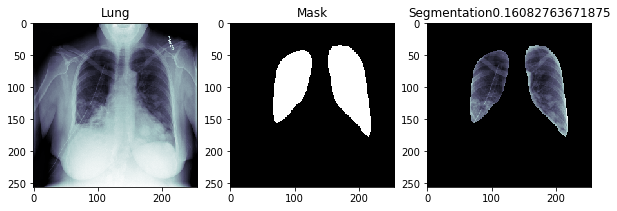

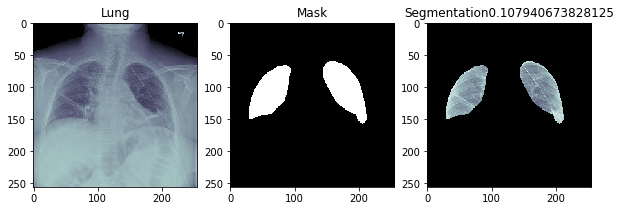

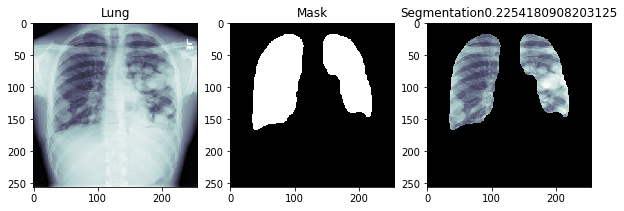

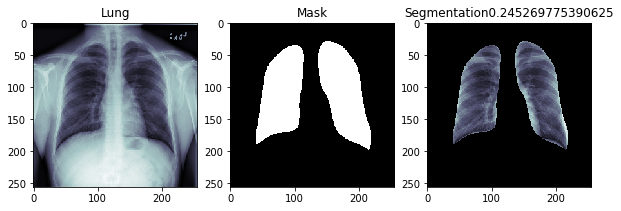

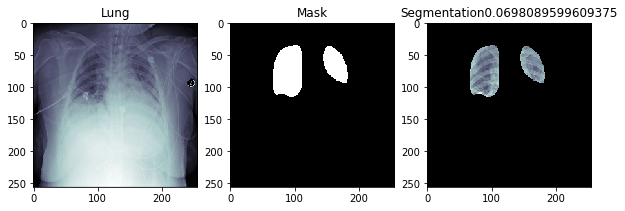

...

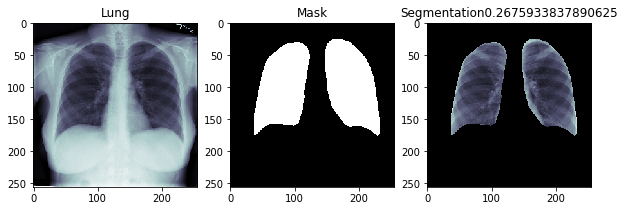

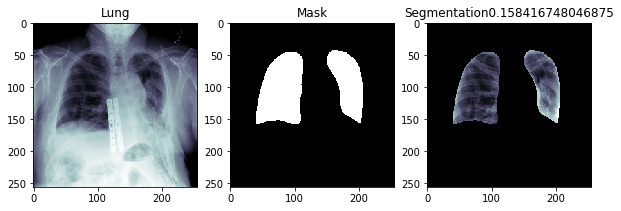

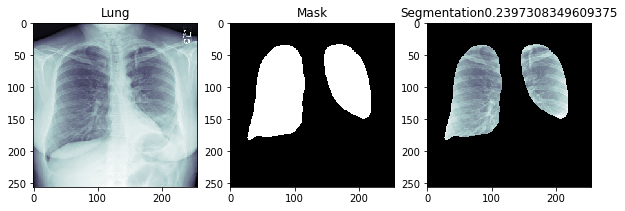

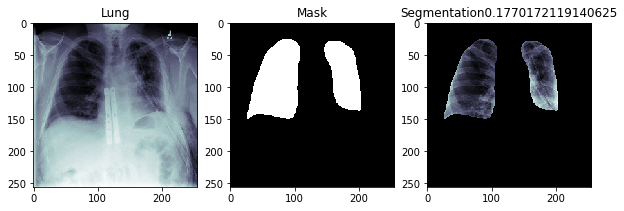

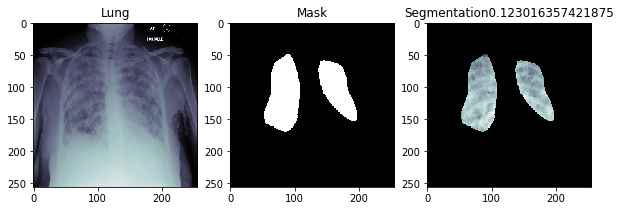

In [10]:
idx = 0
num_img = 50
import cv2
import matplotlib.pyplot as plt
for img1 in testGenerator2(CASE_DIR,num_img):
#for img1 in testGene2:
    #print(img1.shape)
    plt.figure(figsize=(10,20))
    plt.subplot(1,3,1)
    
    plt.imshow(img1[0,:,:,0],cmap=plt.cm.bone)
    #plt.axes('off')
    plt.title("Lung")
    
    plt.subplot(1,3,2)
    mask = results2[idx,:,:,0] > 0.5
    #print(mask.shape)
    plt.imshow(mask,cmap=plt.cm.bone)
    #plt.axes('off')
    plt.title("Mask")
    
    plt.subplot(1,3,3)
    croped = cv2.bitwise_and(img1[0,:,:,0],img1[0,:,:,0],mask=mask.astype(np.uint8))
    #print(croped.shape)
    plt.imshow(croped,cmap=plt.cm.bone)
    #plt.axes('off')
    plt.title("Segmentation"+str(np.sum(mask==True)/256/256))
    idx += 1
#     if idx >= num_img:
#         break
    
# img = pydicom.read_file(case_fp).pixel_array
# #img = np.stack([img]*3, -1)
# import skimage.transform as trans
# img_re = trans.resize(img,(256,256))

# plt.imshow(img_re, cmap=plt.cm.bone)
# _mask = result[0,:,:,0] > 0.5
# print(_mask)

# plt.imshow(_mask, cmap=plt.cm.bone)

# croped = cv2.bitwise_and(img_re, img_re, mask=_mask.astype(np.uint8))
# print(croped.shape)
# plt.imshow(croped, cmap=plt.cm.bone)


In [ ]:
cntMask = np.sum(mask == True)
print(cntMask)
print(cntMask/256/256)

[0. 0. 0. 0. 0. 0. 0. 0.]
[  4.  38.  64. 183. 274. 246. 140.  51.]


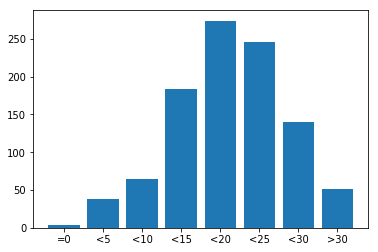

In [13]:
c = np.zeros(8)
print(c)
for msk in results2:
    #print(msk.shape)
    #print(msk[:,:,0])
    cnt = np.sum(msk[:,:,0] >0.5)/256./256.
    if  cnt == 0:
        c[0] += 1
    elif cnt <= 0.05:
        c[1] += 1
    elif cnt <= 0.1:
        c[2] += 1
    elif cnt <= 0.15:
        c[3] += 1
    elif cnt <= 0.2:
        c[4] += 1
    elif cnt <= 0.25:
        c[5] += 1
    elif cnt <= 0.3:
        c[6] += 1
    else:
        c[7] += 1
print(c)
b = ["=0","<5","<10","<15","<20","<25","<30",">30"]
plt.bar(b, c)
plt.show()

In [14]:

testGene3 = testGenerator2(TEST_DIR,1000)
model3 = unet()
model3.load_weights("unet_lung_1015.hdf5")
results3 = model3.predict_generator(testGene3,1000,verbose=1)

1000/1000 [==============================] - 34s 34ms/step


[0. 0. 0. 0. 0. 0. 0. 0.]
[  3.  22.  86. 169. 255. 273. 142.  50.]


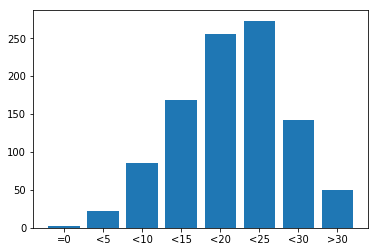

In [15]:
c2 = np.zeros(8)
print(c2)
for msk in results3:
    #print(msk.shape)
    #print(msk[:,:,0])
    cnt = np.sum(msk[:,:,0] >0.5)/256./256.
    if  cnt == 0:
        c2[0] += 1
    elif cnt <= 0.05:
        c2[1] += 1
    elif cnt <= 0.1:
        c2[2] += 1
    elif cnt <= 0.15:
        c2[3] += 1
    elif cnt <= 0.2:
        c2[4] += 1
    elif cnt <= 0.25:
        c2[5] += 1
    elif cnt <= 0.3:
        c2[6] += 1
    else:
        c2[7] += 1
print(c2)
b = ["=0","<5","<10","<15","<20","<25","<30",">30"]
plt.bar(b, c2)
plt.show()

In [6]:

annots = pd.read_csv(os.path.join(LABEL_DIR, "stage_1_train_labels.csv"))
annots.head()

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


In [49]:
num_show = 100
cnt = 1

for row in tqdm(annots.values[:num_show]):
    t = row[5] 
    if t == 1:
        #plt.figure(figsize=(10,10))
        patient_id = row[0]

        x = int(row[1])
        y = int(row[2])
        w = int(row[3])
        h = int(row[4])
        box = np.zeros([1024,1024])
        tmp = np.zeros([1024])
        tmp[x:x+w+1] = 1
        box[y:y+h+1] = tmp
        box =trans.resize(box,(256,256))
        box = np.expand_dims(np.expand_dims(box,axis = 0),axis=3)
#         x = x*256/1024
#         y = y*256/1024
#         w = w*256/1024
#         h = h*256/1024
        print(patient_id)
        img_fp = LABEL_DIR+"/stage_1_train_segmentations/"+patient_id+".png"
        seg = cv2.imread(img_fp)/[255.]
        seg = np.expand_dims(np.expand_dims(seg,axis = 0),axis=3)
        iu = iou(box,seg)
        print(iu[0,0])
#         img = pydicom.read_file(CASE_DIR+"/"+patient_id+".dcm").pixel_array
#         img = trans.resize(img,(256,256))
#         plt.subplot(1,2,1)
#         plt.imshow(img,cmap=plt.cm.bone)
#         plt.plot([x, x, x+w, x+w, x], [y, y+h, y+h, y, y])
        
#         plt.subplot(1,2,2)
#         plt.imshow(seg,cmap=plt.cm.bone)
#         plt.plot([x, x, x+w, x+w, x], [y, y+h, y+h, y, y])
#         cnt+=1
        

  9%|▉         | 9/100 [00:00<00:01, 73.67it/s]

00436515-870c-4b36-a041-de91049b9ab4
Tensor("strided_slice_49:0", shape=(), dtype=float64)
00436515-870c-4b36-a041-de91049b9ab4
Tensor("strided_slice_50:0", shape=(), dtype=float64)
00704310-78a8-4b38-8475-49f4573b2dbb
Tensor("strided_slice_51:0", shape=(), dtype=float64)
00704310-78a8-4b38-8475-49f4573b2dbb
Tensor("strided_slice_52:0", shape=(), dtype=float64)
00aecb01-a116-45a2-956c-08d2fa55433f
Tensor("strided_slice_53:0", shape=(), dtype=float64)
00aecb01-a116-45a2-956c-08d2fa55433f


 20%|██        | 20/100 [00:00<00:01, 53.61it/s]

Tensor("strided_slice_54:0", shape=(), dtype=float64)
00c0b293-48e7-4e16-ac76-9269ba535a62
Tensor("strided_slice_55:0", shape=(), dtype=float64)
00c0b293-48e7-4e16-ac76-9269ba535a62
Tensor("strided_slice_56:0", shape=(), dtype=float64)
00f08de1-517e-4652-a04f-d1dc9ee48593
Tensor("strided_slice_57:0", shape=(), dtype=float64)
00f08de1-517e-4652-a04f-d1dc9ee48593
Tensor("strided_slice_58:0", shape=(), dtype=float64)
0100515c-5204-4f31-98e0-f35e4b00004a
Tensor("strided_slice_59:0", shape=(), dtype=float64)
010ccb9f-6d46-4380-af11-84f87397a1b8


 29%|██▉       | 29/100 [00:00<00:01, 47.39it/s]

Tensor("strided_slice_60:0", shape=(), dtype=float64)
010ccb9f-6d46-4380-af11-84f87397a1b8
Tensor("strided_slice_61:0", shape=(), dtype=float64)
012a5620-d082-4bb8-9b3b-e72d8938000c
Tensor("strided_slice_62:0", shape=(), dtype=float64)
012a5620-d082-4bb8-9b3b-e72d8938000c
Tensor("strided_slice_63:0", shape=(), dtype=float64)
0174c4bb-28f5-41e3-a13f-a396badc18bd
Tensor("strided_slice_64:0", shape=(), dtype=float64)
0174c4bb-28f5-41e3-a13f-a396badc18bd
Tensor("strided_slice_65:0", shape=(), dtype=float64)
019d950b-dd38-4cf3-a686-527a75728be6


 44%|████▍     | 44/100 [00:00<00:01, 52.87it/s]

Tensor("strided_slice_66:0", shape=(), dtype=float64)
019d950b-dd38-4cf3-a686-527a75728be6
Tensor("strided_slice_67:0", shape=(), dtype=float64)
01a6eaa6-222f-4ea8-9874-bbd89dc1a1ce
Tensor("strided_slice_68:0", shape=(), dtype=float64)
01a6eaa6-222f-4ea8-9874-bbd89dc1a1ce
Tensor("strided_slice_69:0", shape=(), dtype=float64)
01a7353d-25bb-4ff8-916b-f50dd541dccf
Tensor("strided_slice_70:0", shape=(), dtype=float64)
01a7353d-25bb-4ff8-916b-f50dd541dccf
Tensor("strided_slice_71:0", shape=(), dtype=float64)
01adfd2f-7bc7-4cef-ab68-a0992752b620
Tensor("strided_slice_72:0", shape=(), dtype=float64)
01b9e362-4950-40f5-88fa-7557ac2a45bb


 59%|█████▉    | 59/100 [00:01<00:00, 55.73it/s]

Tensor("strided_slice_73:0", shape=(), dtype=float64)
01b9e362-4950-40f5-88fa-7557ac2a45bb
Tensor("strided_slice_74:0", shape=(), dtype=float64)
01be392f-a46d-4aef-a57e-9cd1a80dd47e
Tensor("strided_slice_75:0", shape=(), dtype=float64)
01be392f-a46d-4aef-a57e-9cd1a80dd47e
Tensor("strided_slice_76:0", shape=(), dtype=float64)
01cad8d0-45cd-4603-b099-94055d322310
Tensor("strided_slice_77:0", shape=(), dtype=float64)
01cad8d0-45cd-4603-b099-94055d322310
Tensor("strided_slice_78:0", shape=(), dtype=float64)
01cd2ba5-2baf-44b2-bf15-ee57e1ea4599
Tensor("strided_slice_79:0", shape=(), dtype=float64)


 81%|████████  | 81/100 [00:01<00:00, 68.01it/s]

01d4fa0f-97a0-4522-b0d8-134400db2a3e
Tensor("strided_slice_80:0", shape=(), dtype=float64)
01d4fa0f-97a0-4522-b0d8-134400db2a3e
Tensor("strided_slice_81:0", shape=(), dtype=float64)
01dc817c-3cfa-49fe-8662-518edc30652a
Tensor("strided_slice_82:0", shape=(), dtype=float64)
01f3abc2-33c7-4ea2-a599-dc49b76fcfae
Tensor("strided_slice_83:0", shape=(), dtype=float64)
01f3abc2-33c7-4ea2-a599-dc49b76fcfae
Tensor("strided_slice_84:0", shape=(), dtype=float64)
01fa0f5e-00c3-41cb-b5c7-10600c8633ae
Tensor("strided_slice_85:0", shape=(), dtype=float64)
01fa0f5e-00c3-41cb-b5c7-10600c8633ae
Tensor("strided_slice_86:0", shape=(), dtype=float64)
01fdfd88-7607-48b9-ba05-a36e8b6fd19b
Tensor("strided_slice_87:0", shape=(), dtype=float64)
01fdfd88-7607-48b9-ba05-a36e8b6fd19b
Tensor("strided_slice_88:0", shape=(), dtype=float64)
02002619-3dea-4038-8d4d-458db30ed8de


 89%|████████▉ | 89/100 [00:01<00:00, 41.79it/s]

Tensor("strided_slice_89:0", shape=(), dtype=float64)
02002619-3dea-4038-8d4d-458db30ed8de
Tensor("strided_slice_90:0", shape=(), dtype=float64)
020380f8-5c5a-4ded-bdf3-9ce3036945b4
Tensor("strided_slice_91:0", shape=(), dtype=float64)
020380f8-5c5a-4ded-bdf3-9ce3036945b4
Tensor("strided_slice_92:0", shape=(), dtype=float64)
02099738-7465-4786-b71c-de8cdac477c3
Tensor("strided_slice_93:0", shape=(), dtype=float64)
02099738-7465-4786-b71c-de8cdac477c3
Tensor("strided_slice_94:0", shape=(), dtype=float64)
020a16e3-baf9-4cf0-859c-c79b5253d717
Tensor("strided_slice_95:0", shape=(), dtype=float64)


100%|██████████| 100/100 [00:01<00:00, 55.39it/s]

020a16e3-baf9-4cf0-859c-c79b5253d717
Tensor("strided_slice_96:0", shape=(), dtype=float64)
02285fa4-35b7-4af6-b88f-3cac45a7f5c8
Tensor("strided_slice_97:0", shape=(), dtype=float64)
